# Learning Lab t-SNE

All needed imports.

In [54]:
import numpy as np
import pandas as pd
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, LabelEncoder

## Read data
Read data using the pandas `read_csv` function. Change the file to calculate and plot a t-SNE for your dataset.

In [55]:
''' Read Data from csv file and store in dataframe df '''
df_learning_lab = pd.read_csv('../Data Files/Learning_lab/marketing_campaign.csv', sep=None, engine='python').set_index('ID')

### Function getObjectColumns
This function searches in the feeded dataframe for columns where the dtype is object and appends it to a list. This list gets returned.

In [56]:
''' 
    Function to get name of every column where the dtype is object and append it to a list
    returns the list with column names 
'''

def getObjectColumns(df):
    object_cols_array = []
    for col in df.columns:
        if df[col].dtype == 'object':
            object_cols_array.append(col)
    return object_cols_array          

### Function removeColumnsWithMoreThanNValuesMissing
This function removes every column where more than n% of the values are missing. Returns the dataframe with removed columns.

In [57]:
''' 
    Function for removing features with more than n% missing values 
    returns dataframe with features where less than n% values are missing
'''

def removeColumnsWithMoreThanNValuesMissing(df, n):
    for col in df.columns:
        if df[col].isna().sum() >= (n*len(df)):
            df.drop(labels=col, axis=1, inplace=True)
    return df           

### Function encodeObjectColumns
This function needs an encoder, the created object list from `getObjectColumns` and the dataframe with removed columns.
It encodes the object columns.

In [58]:
''' 
    Function for encoding columns with dtype object 
    returns dataframe with encoded features
'''

def encodeObjectColumns(df, encoder, object_cols_list):
    if len(object_cols_list) > 0:
        df[object_cols_list] = df[object_cols_list].apply(encoder.fit_transform)
    return df    

### Scale Data
This function needs a scaler and the dataframe to scale the dataframe and return it.

In [59]:
''' Function for scaling data and return scaled dataframe '''
def scaleData(scaler, df):
    scaled_data = scaler.fit_transform(df)
    scaled_df = pd.DataFrame(scaled_data, columns=df.columns)
    return scaled_df

### Unscale Data
This function needs the scaler and the scaled dataframe. It unscales the data and returns the unscaled dataframe.

In [60]:
'''
    Function to unscale data for better reading/understanding
    returns unscaled dataframe
'''
def unscaleData(scaler, df):
    dfUnscaled = scaler.inverse_transform(df)
    dfUnscaled = pd.DataFrame(dfUnscaled, columns=df.columns)
    return dfUnscaled

## t-SNE parameters
| Parameter name | Description | min value | max value | default value |
| :---           |    :---:    |    :---:  |   :---:   |    ---:       |
| n_components   | Dimension of t-SNE (2D/3D) | 2 | 3 | 2|
| perplexity     | used nearest neighbors (like kNN's) | 5.0 | 50.0 | 30.0 |
| early_exaggeration | tightness of natural clusters | N/A | N/A | 12.0|
| learning_rate | distance between clusters (too high = cluster looks like a ball / too low = cluster looks like a compressed dense cloud) | 10.0 | 1000.0 |200.0|
| n_iter | maximum number of iterations | 250 | N/A | 1000|
| n_iter_without_progress | maximum number of iterations without progress (only in 50er steps 250/300/350) | N/A | N/A | 300|
| random_state | for reproducible results | N/A | N/A | None|
|       |  | From here on too complicated parameters |  | |
| min_grad_norm | stops optimization if gradient norm is below this value | N/A | N/A | 1e-7|
| metric | metric used for calculation | 'precomputed' | 'exact'/'euclidean' | 'euclidean'|
| init | initialization of embedding | 'random' | 'pca' | 'random'|
| verbose | verbosity level | N/A | N/A | 0|
| method | approximation for gradient calculation | 'exact' | 'barnes_hut' | 'barnes_hut'|
| angle | trade-off between speed and accuracy (Only when `method='barnes_hut'`) | N/A | N/A | 0.5|
| n_jobs | number of parallel jobs run for neighbors search | -1 (using all processors) | 1 | None|
| square_distance | square distance values | True | 'legacy' | 'legacy'|

### Calculate t-SNE
This function needs the first 7 parameters from the table above. The other parameters are just optional. It calculates the t-SNE, copies the original dataframe and adds two columns `tsne_x` and `tsne_y`. At the end it returns the copied dataframe with the two added columns. 

In [61]:
'''
    name of hyperparameter = description (min value, max values) 
    n_components = Dimension of space / default = 2
    perplexity = number of nearest neighbors (5,50) / default = 30.0
    early_exaggeration = tightness of clusters (no values) / default = 12.0
    learning_rate = "Zoom" (10.0, 1000.0) / default = 200.0
    n_iter = max number of iterations for optimization (250, no value) / default = 1000
    n_iter_without_progress = number of iterations without progress (n*50) / default = 300
    min_grad_norm = gradient norm when below this value stop optimization (no values) / default = 1e-7
    metric = used metric for calculating distance (no values) / default = 'euclidean'
    init = initialization of embedding ('random', 'pca') / default = 'random'
    verbose = verbosity level (no values) / default = 0
    random_state = random number generator (no values) / default = None
    method = gradient calculation algorithm (no values) / default = 'barnes_hut'
    angle = used if method = 'barnes_hut' / default = 0.5
    n_jobs = number of parallel jobs running (no values) / default = None
    square_distances = tsne squares the distances (no values) / default = 'legacy'/True

'''
def calculateTSNE(df, n_comp, perplex, exag, lrate, random_state, n_iter, n_iter_wo_pr, norm, 
metric, init, verb, method , angle, n_jobs, sq_dist):
    tsne = TSNE(n_components=n_comp, perplexity=perplex, early_exaggeration=exag, 
    learning_rate=lrate, n_iter=n_iter, n_iter_without_progress=n_iter_wo_pr, 
    min_grad_norm=norm, metric= metric, init=init, verbose=verb, random_state=random_state,
    method=method, angle=angle, n_jobs=n_jobs, square_distances= sq_dist)
    df_tsne = df.copy()
    tsne_fit = tsne.fit_transform(df_tsne)
    df_tsne['tsne_x'] = tsne_fit[:,0]
    df_tsne['tsne_y'] = tsne_fit[:,1]

    return df_tsne

### Tune Parameters
This function calls the calculateTSNE function and 

In [62]:

def tuneHyperparametersTsne(df, scaled_df,  n_components, perplexity, early_exaggeration, learning_rate, random_state, n_iter, n_iter_without_progress, min_grad_norm =1e-7, 
metric = 'euclidean', init = 'random', verbose=0, method = 'barnes_hut', angle = 0.5, n_jobs = None, square_distances = True):
    
    df_tsne = calculateTSNE(df=scaled_df, n_comp=n_components, perplex=perplexity, exag=early_exaggeration, lrate=learning_rate, random_state=random_state, n_iter=n_iter, n_iter_wo_pr=n_iter_without_progress, 
    norm=min_grad_norm, metric=metric, init=init, verb=verbose, method=method, angle=angle, n_jobs=n_jobs, sq_dist=square_distances)
    df['tsne_x'] = df_tsne['tsne_x'].copy()
    df['tsne_y'] = df_tsne['tsne_y'].copy()
    return df

In [63]:
'''


'''

def plotTsneAndSaveToFiles(df, df_name):

    for col in df.columns:
        if not 'tsne' in col:
         
            plt.figure(figsize=(16, 12))
            color = sns.color_palette('colorblind')
            #sns.palplot(color)
            sns.set_palette('bright')
            sns.scatterplot(x='tsne_x', y='tsne_y', hue=col,  data=df, alpha=0.4)
            if not '/' in col:
                plt.savefig('./Output-Files/Tsne_'+ df_name+col+'.jpg')
            else:
                column_name = col.replace('/', '_')
                plt.savefig('./Output-Files/Tsne_'+ df_name+column_name+'.jpg')   
            #plt.show()

In [64]:

scaler = StandardScaler()
le = LabelEncoder()
object_list = getObjectColumns(df_learning_lab)
df_learning_lab = encodeObjectColumns(df_learning_lab, le, object_list)
df_learning_lab.dropna(axis=0, inplace=True)
scaled_df = scaleData(scaler, df_learning_lab)


In [188]:
'''
    DEFAULT VALUES
'''
n_comp=2 
perplex=30.0 
early_exag=12.0 
l_rate=200.0 
rstate=42 
n_i= 1000 
n_i_progress=300

In [189]:

n_i_progress=500 # CHANGE ME

df_learning_lab_n_iter_progress= tuneHyperparametersTsne(df=df_learning_lab, scaled_df=scaled_df, n_components=n_comp, perplexity=perplex, early_exaggeration=early_exag, learning_rate=l_rate, 
random_state=rstate, n_iter= n_i, n_iter_without_progress=n_i_progress)

/tmp/ipykernel_10152/3569143405.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(16, 12))


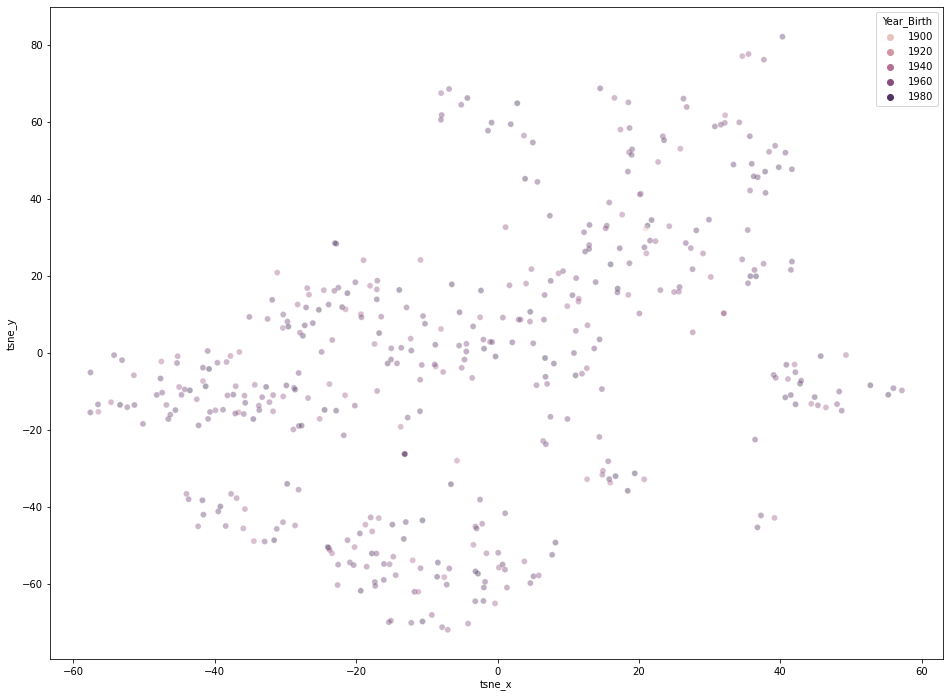

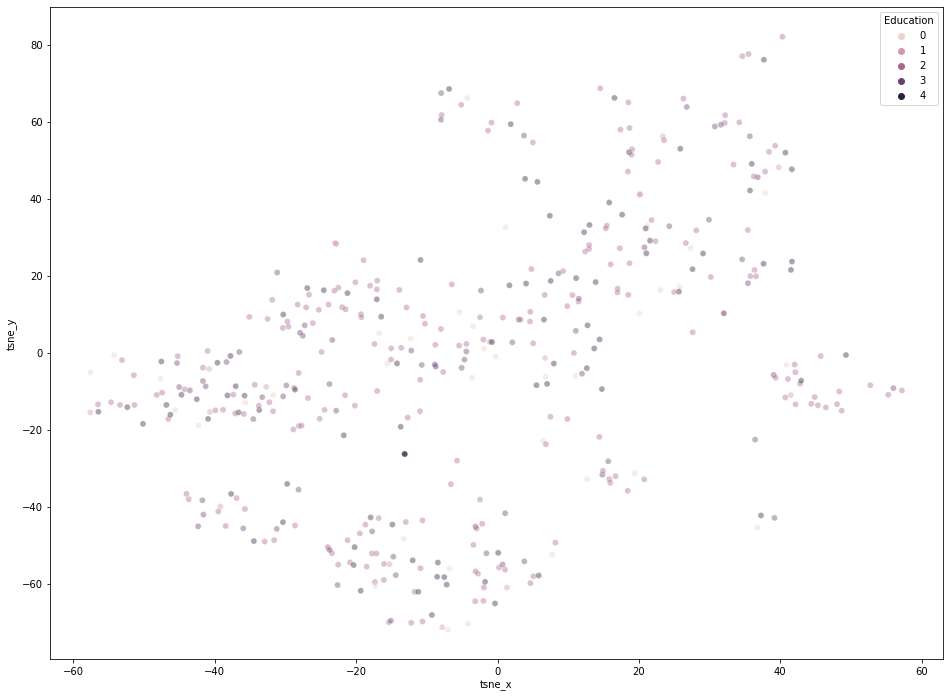

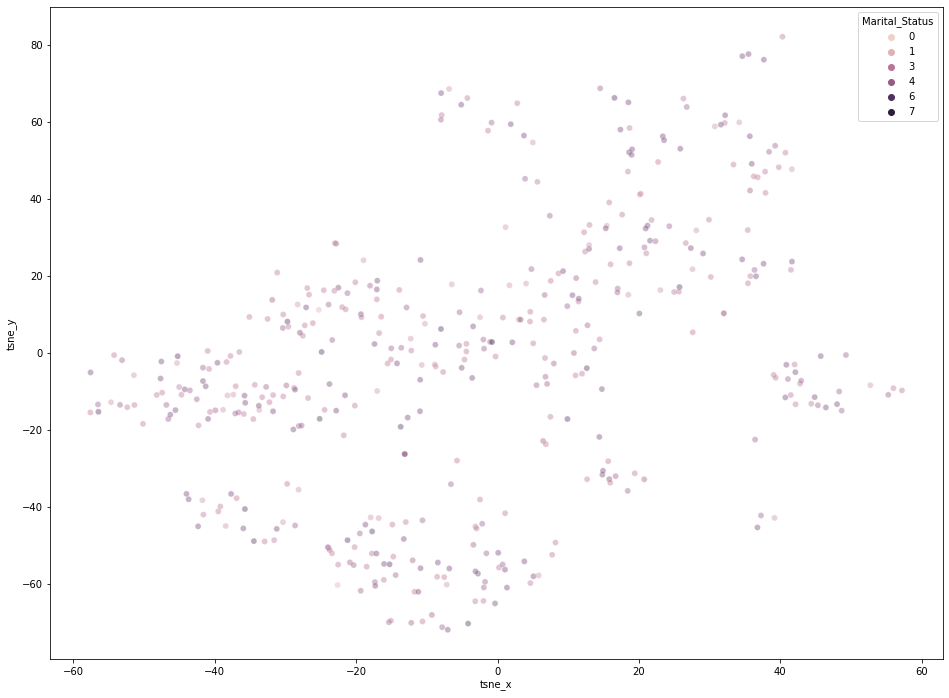

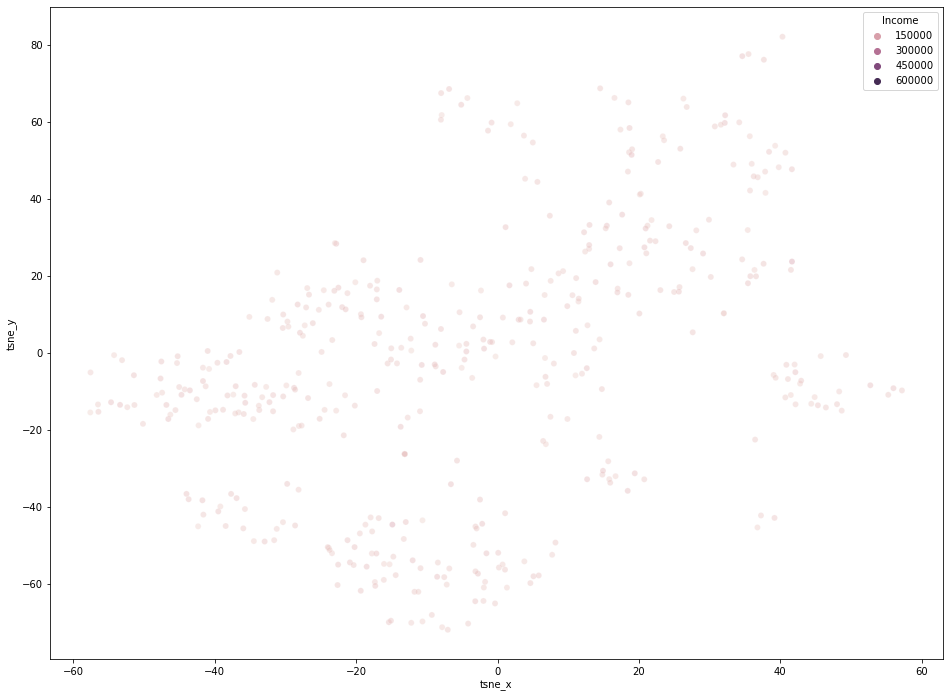

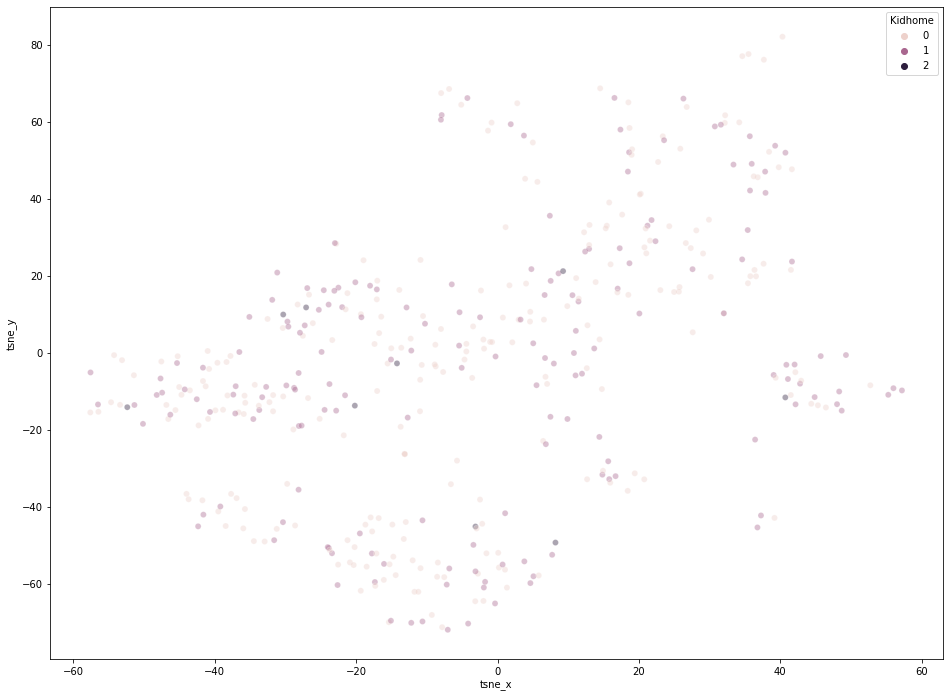

...

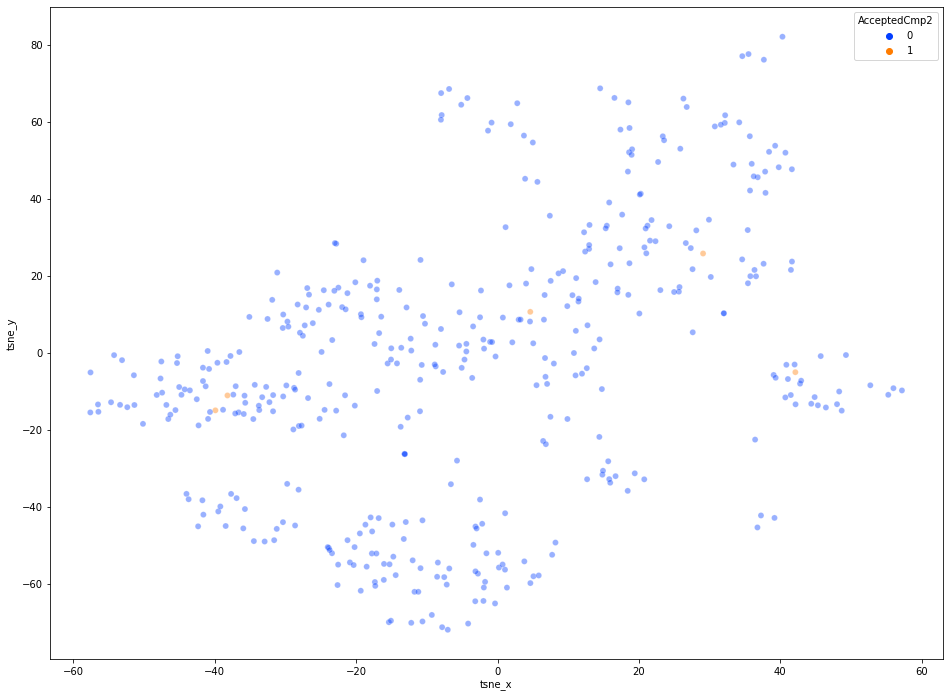

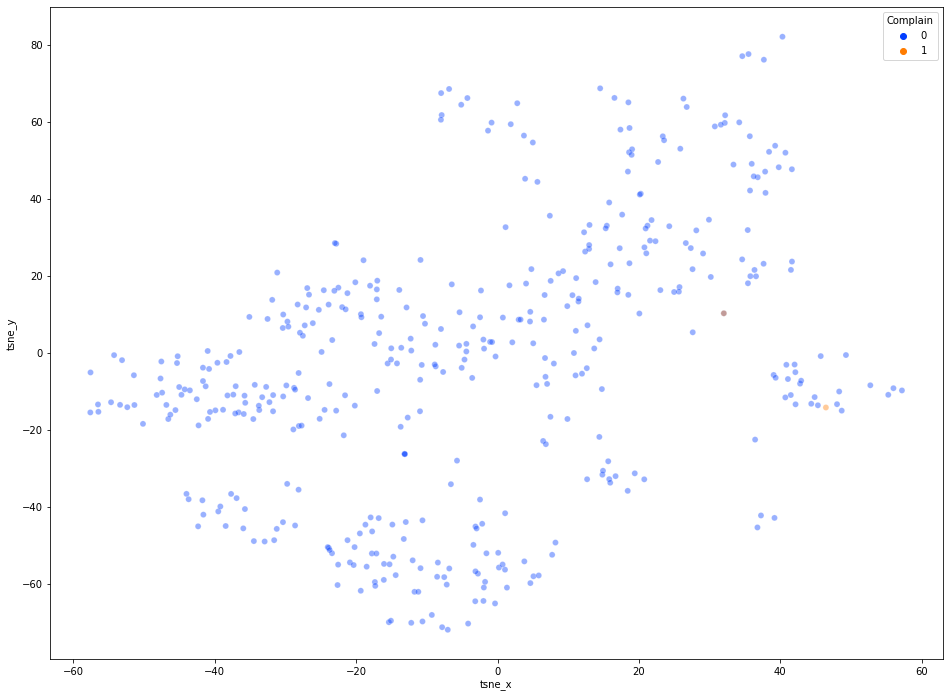

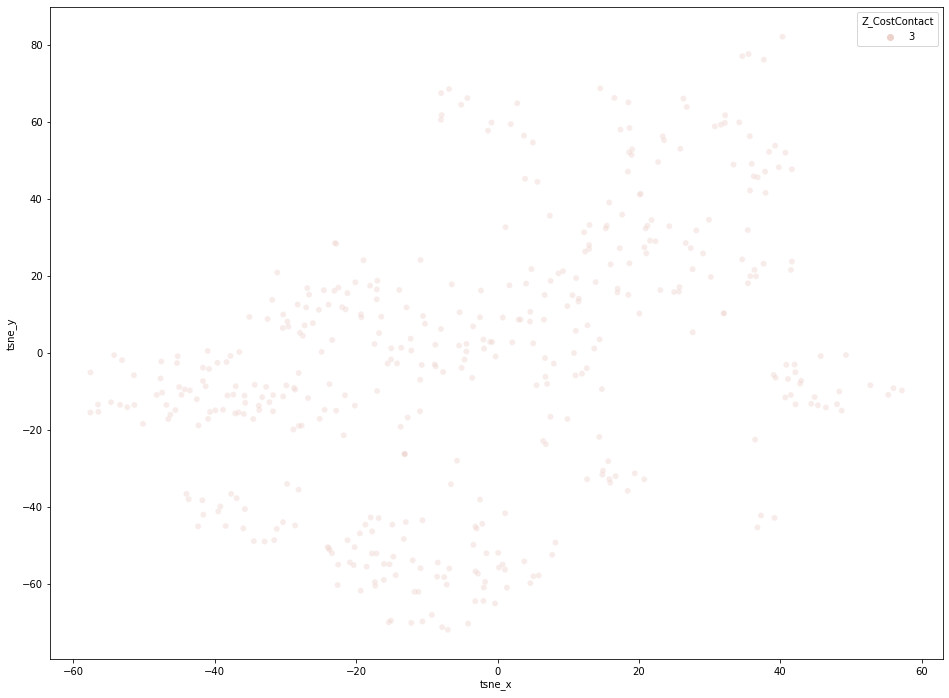

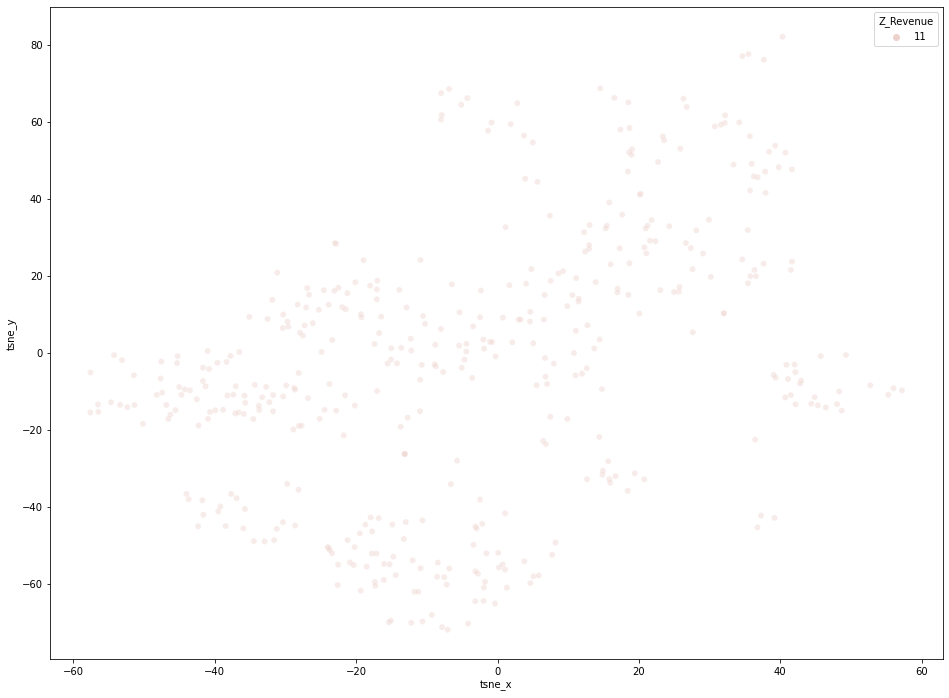

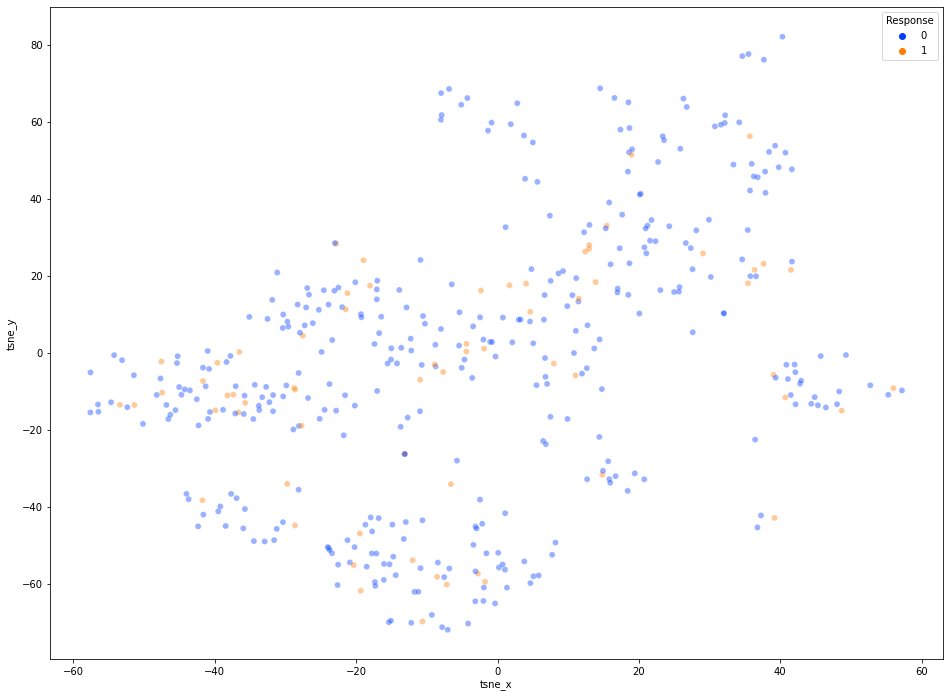

In [190]:
plotTsneAndSaveToFiles(df_learning_lab_n_iter_progress, 'n_iter_progress'+ str(n_i_progress)+'_')

In [191]:
n_i_progress=300 # sets to default value

n_i= 2000 # CHANGE ME


df_learning_lab_n_iter= tuneHyperparametersTsne(df=df_learning_lab, scaled_df=scaled_df, n_components=n_comp, perplexity=perplex, early_exaggeration=early_exag, learning_rate=l_rate, 
random_state=rstate, n_iter= n_i, n_iter_without_progress=n_i_progress)

/tmp/ipykernel_10152/3569143405.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(16, 12))


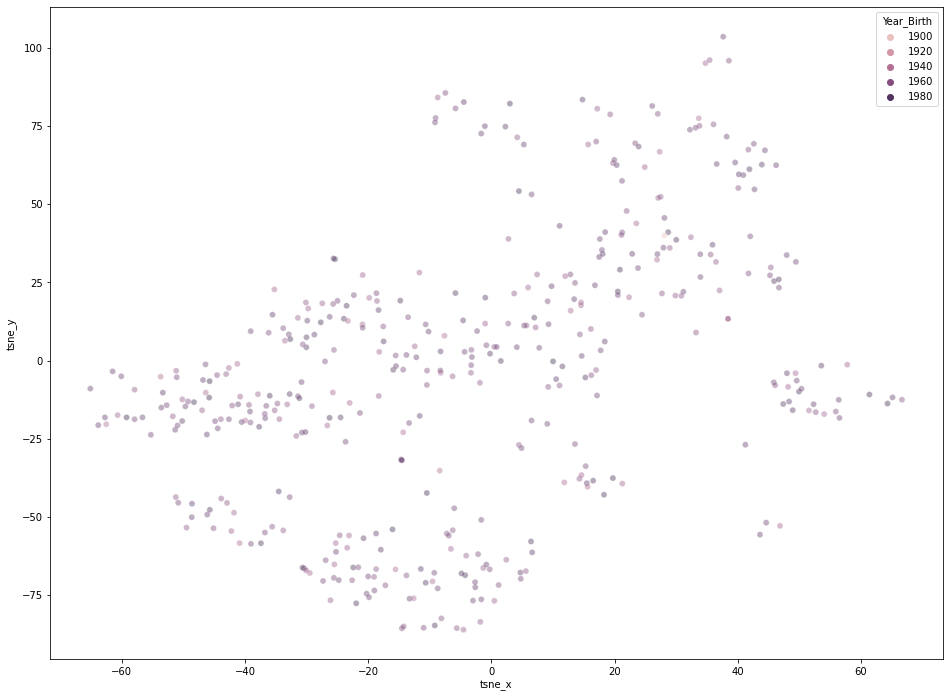

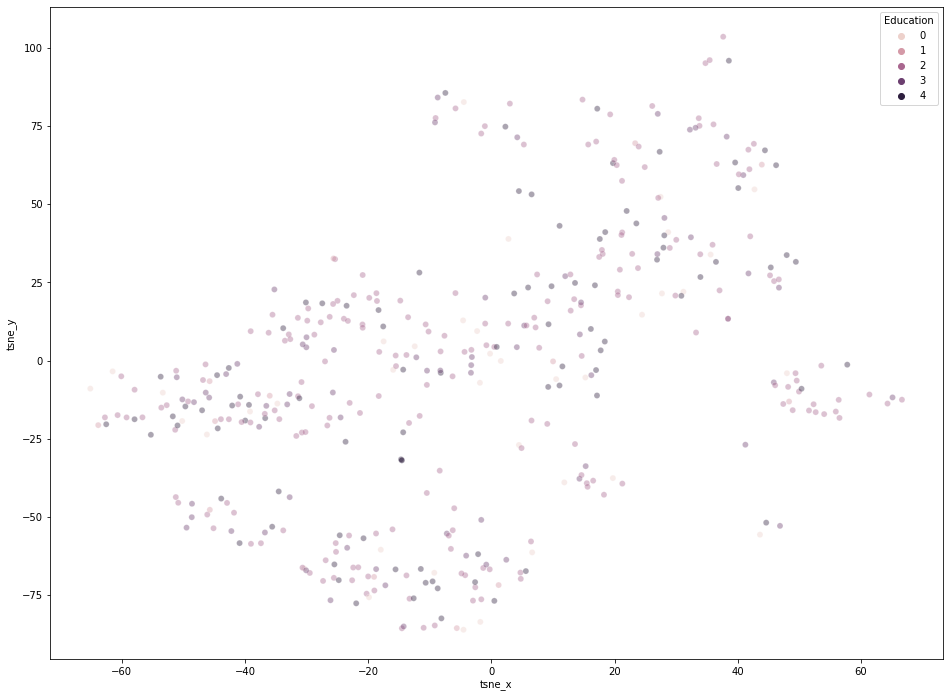

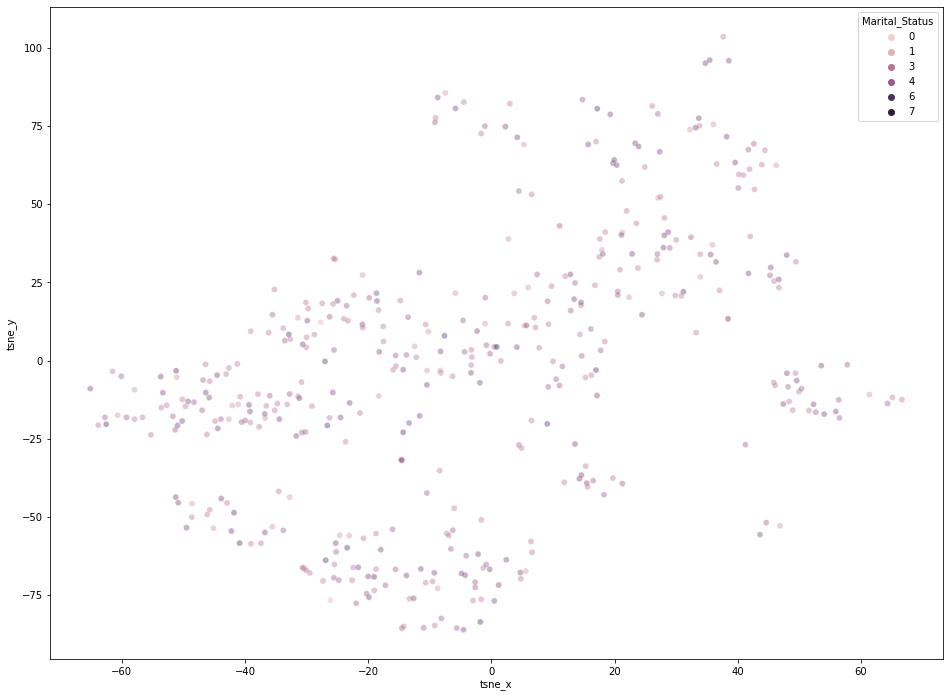

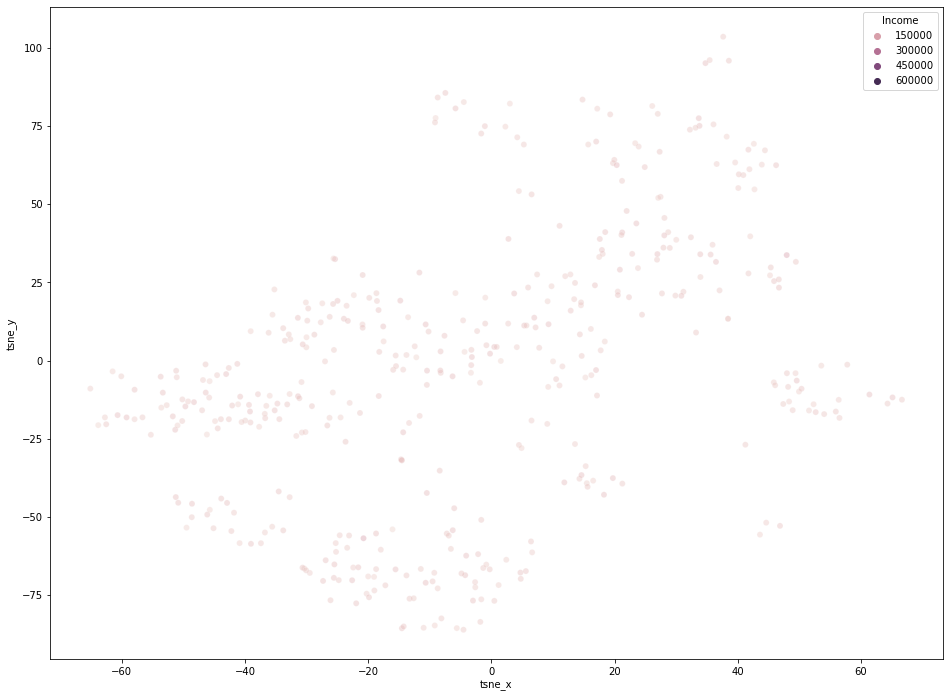

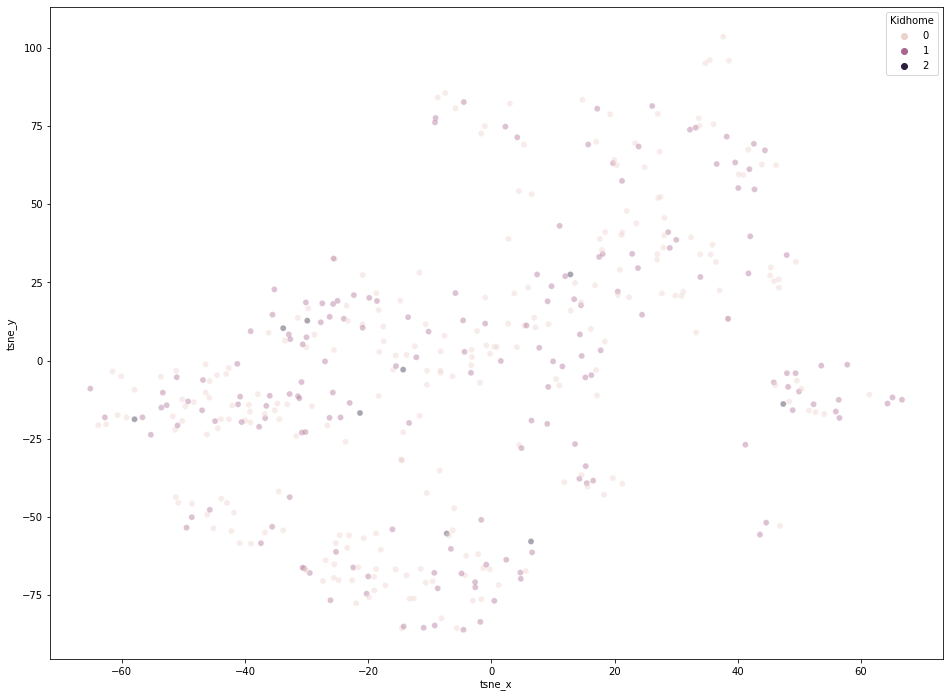

...

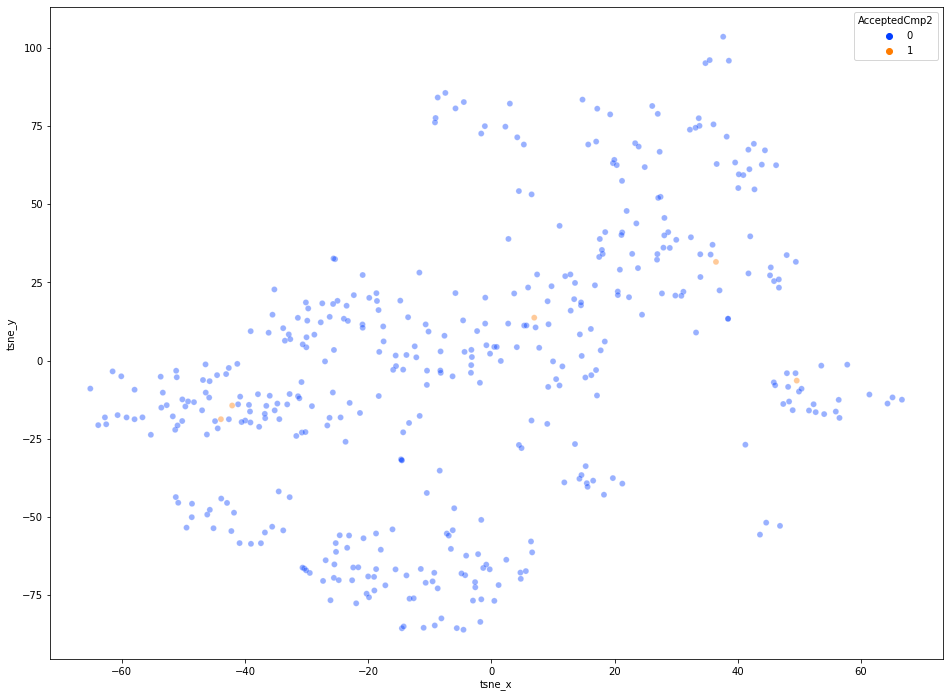

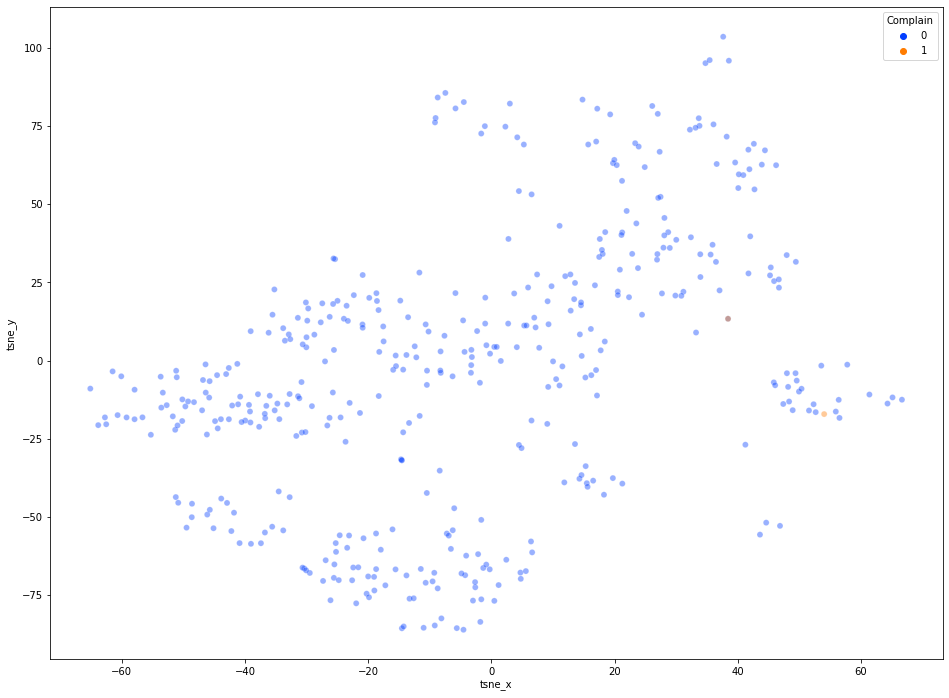

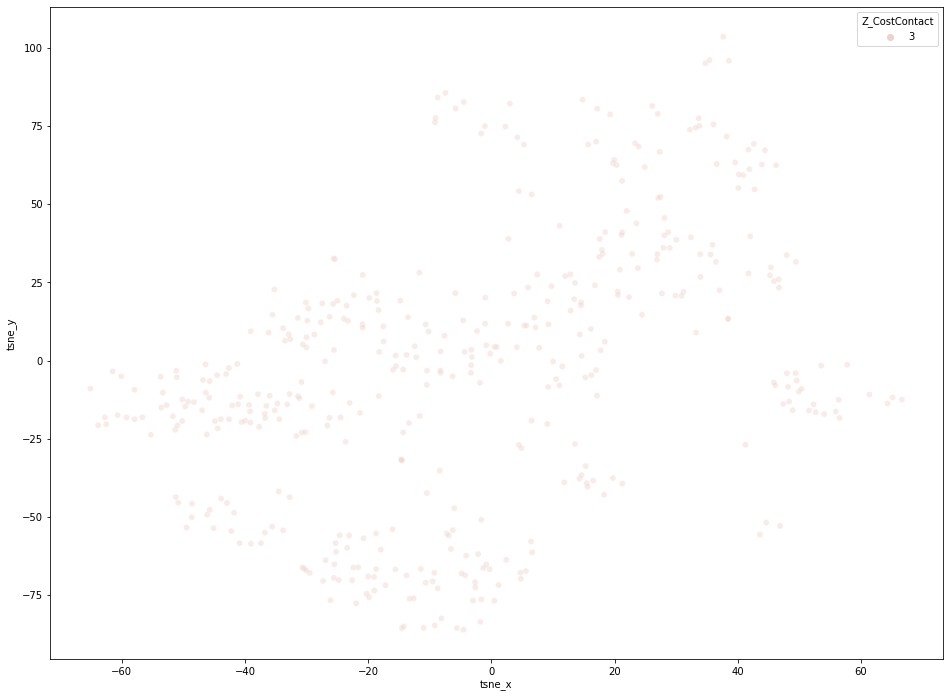

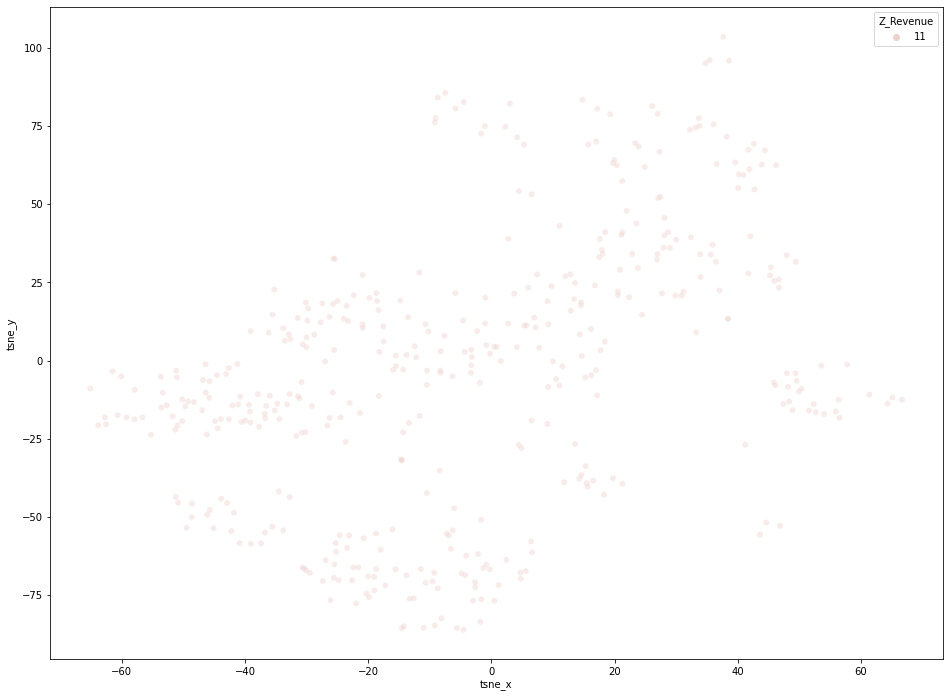

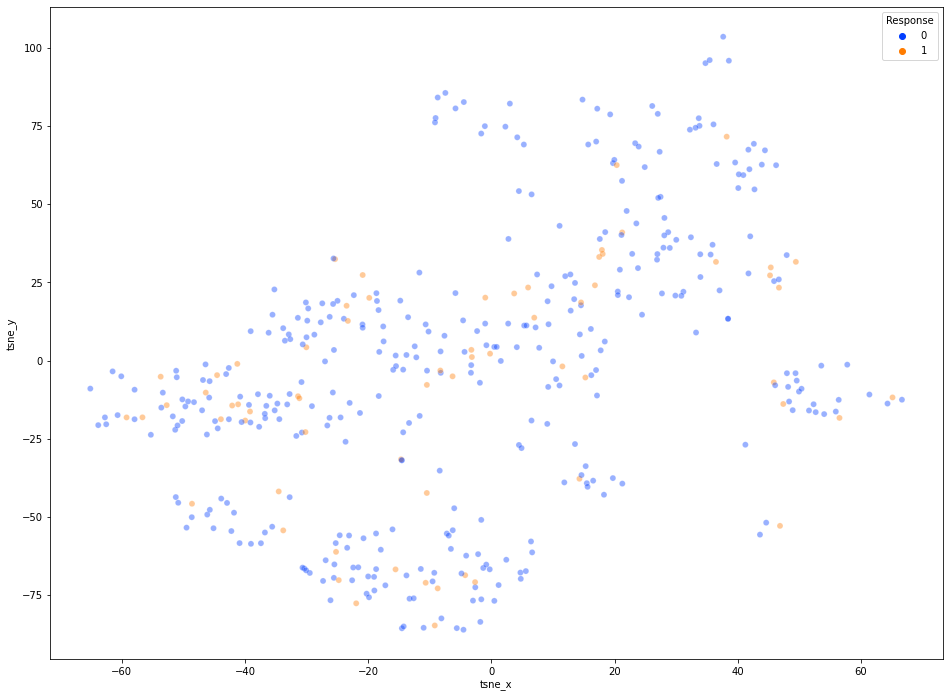

In [192]:
plotTsneAndSaveToFiles(df_learning_lab_n_iter, 'n_iter'+ str(n_i)+'_')

In [65]:
n_i= 1000 # sets to default value


perplex=100.0 # CHANGE ME



df_learning_lab_perplexity = tuneHyperparametersTsne(df=df_learning_lab, scaled_df=scaled_df, n_components=n_comp, perplexity=perplex, early_exaggeration=early_exag, learning_rate=l_rate, 
random_state=rstate, n_iter= n_i, n_iter_without_progress=n_i_progress)


/tmp/ipykernel_34202/3372838540.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(16, 12))


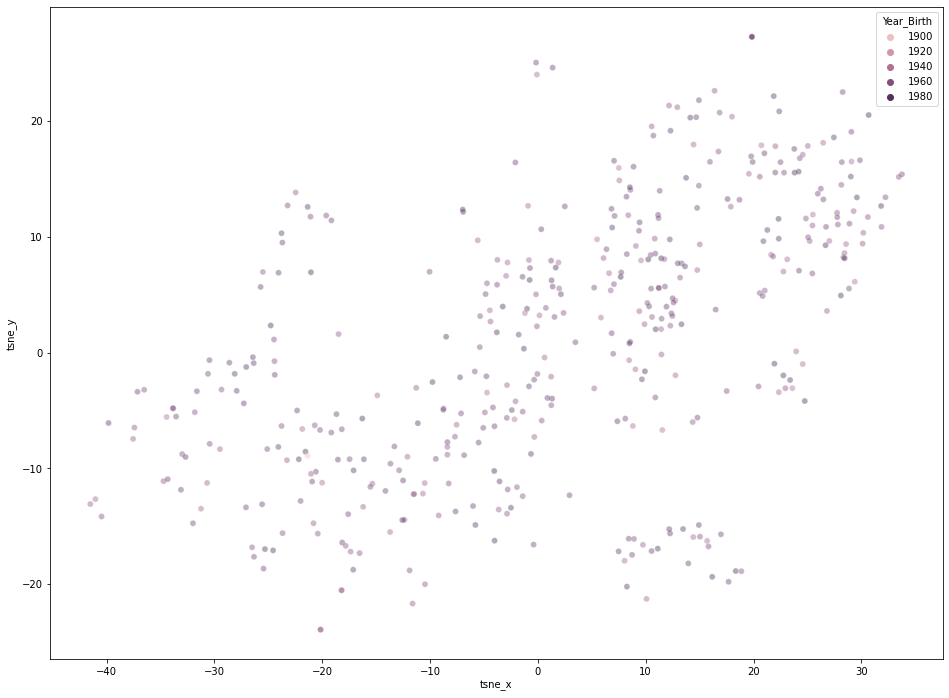

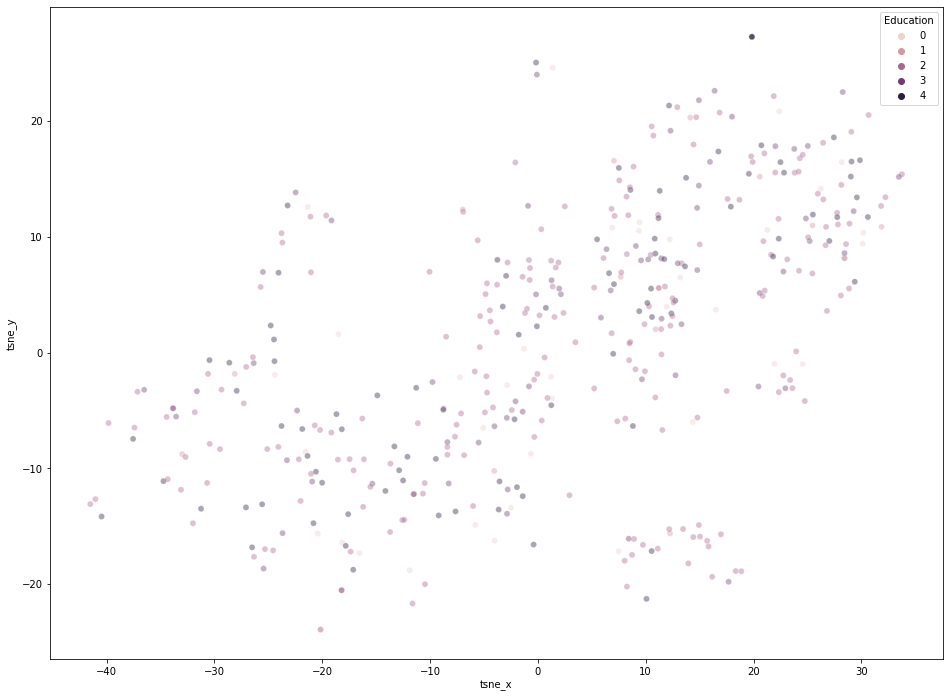

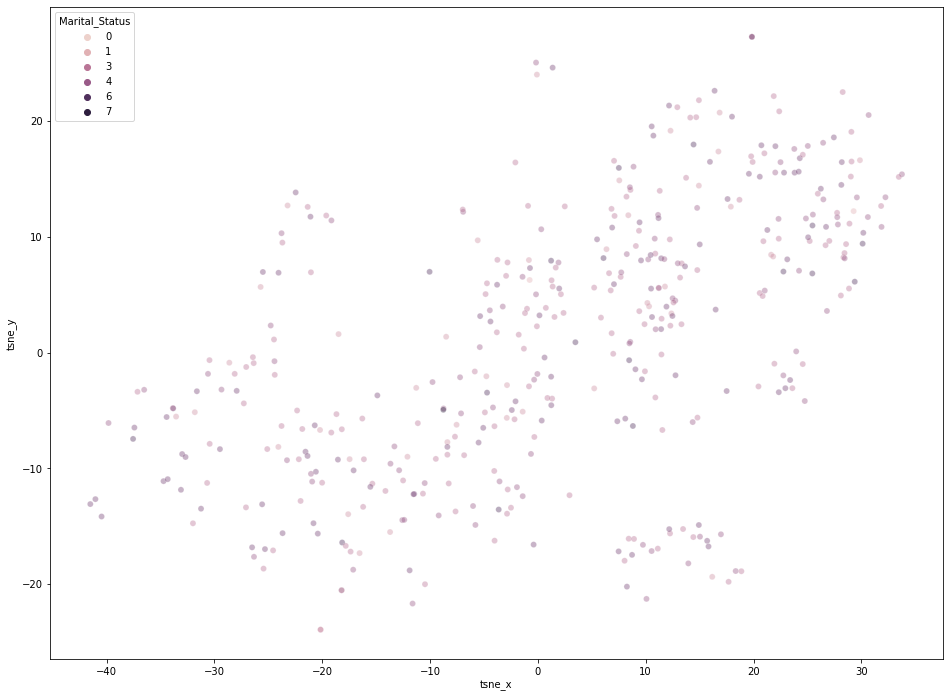

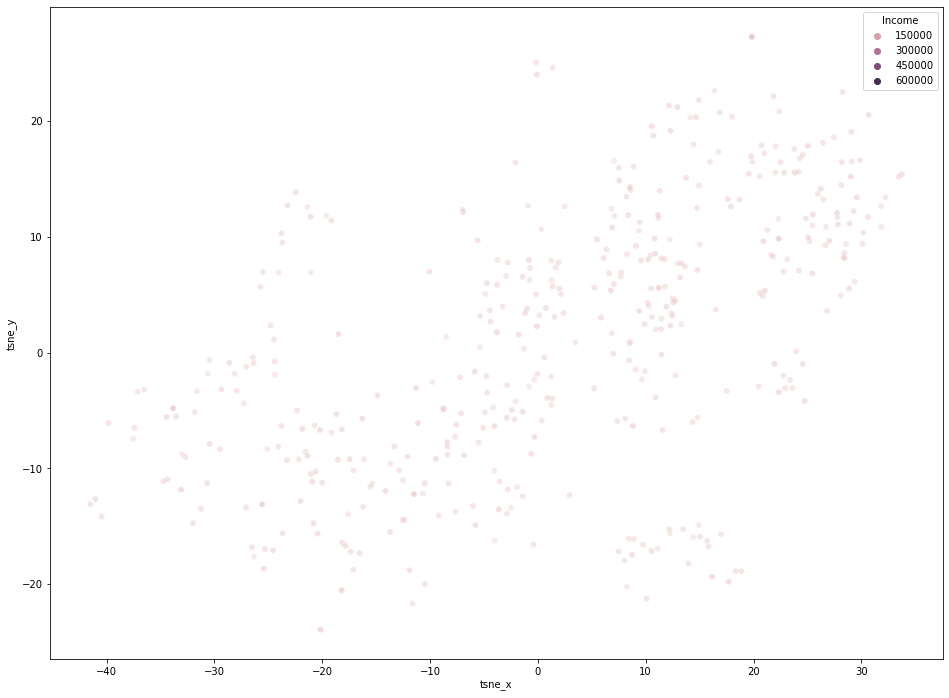

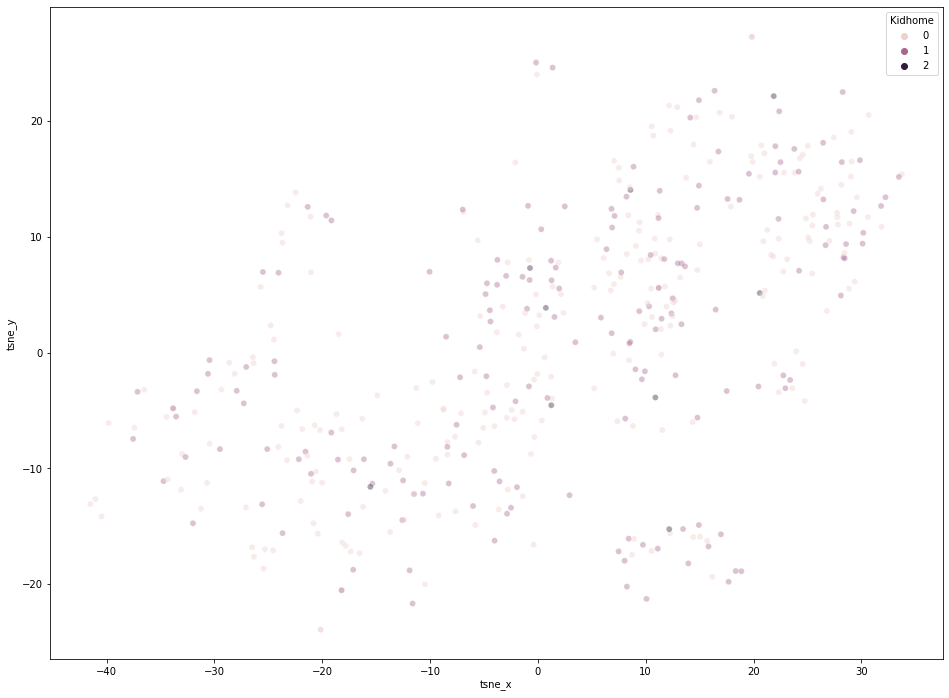

...

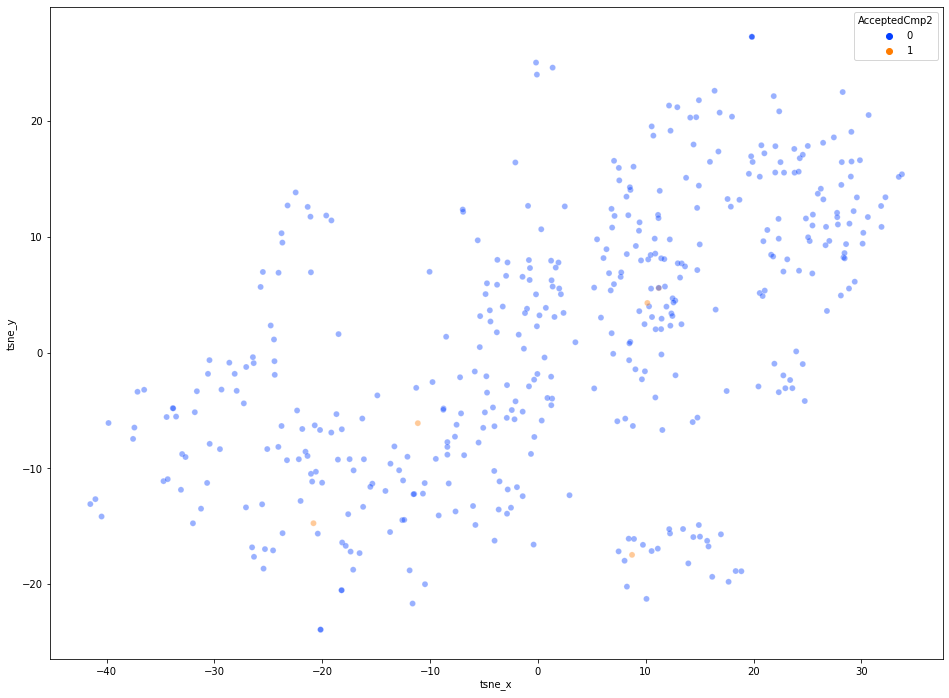

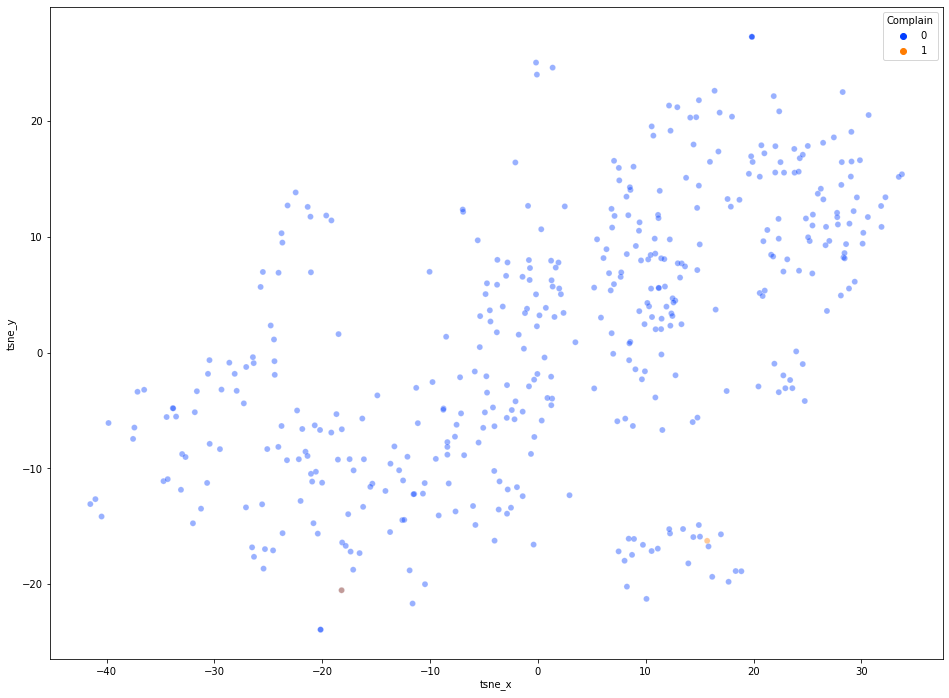

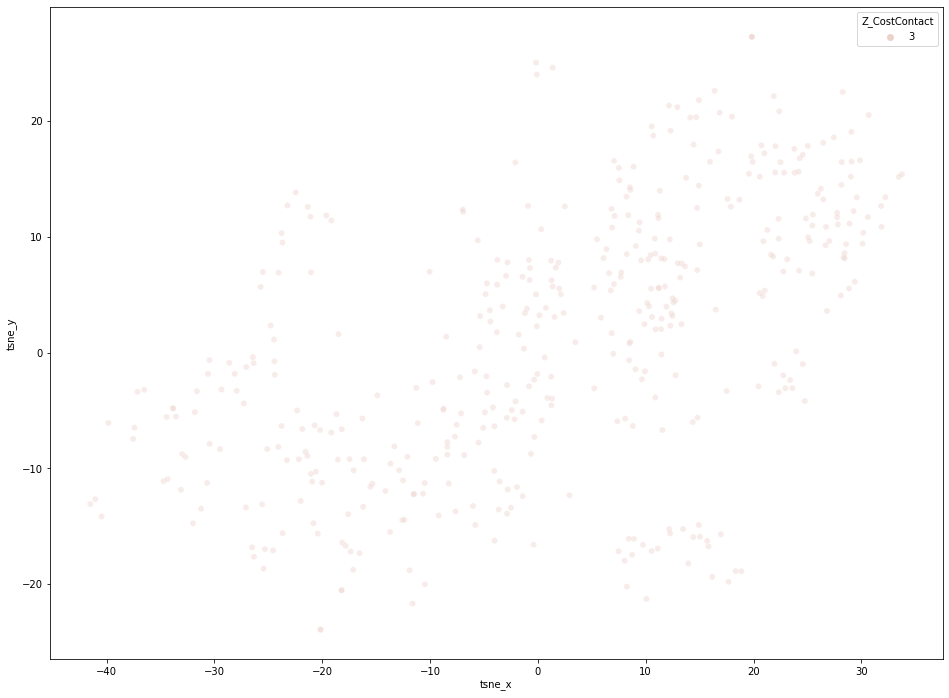

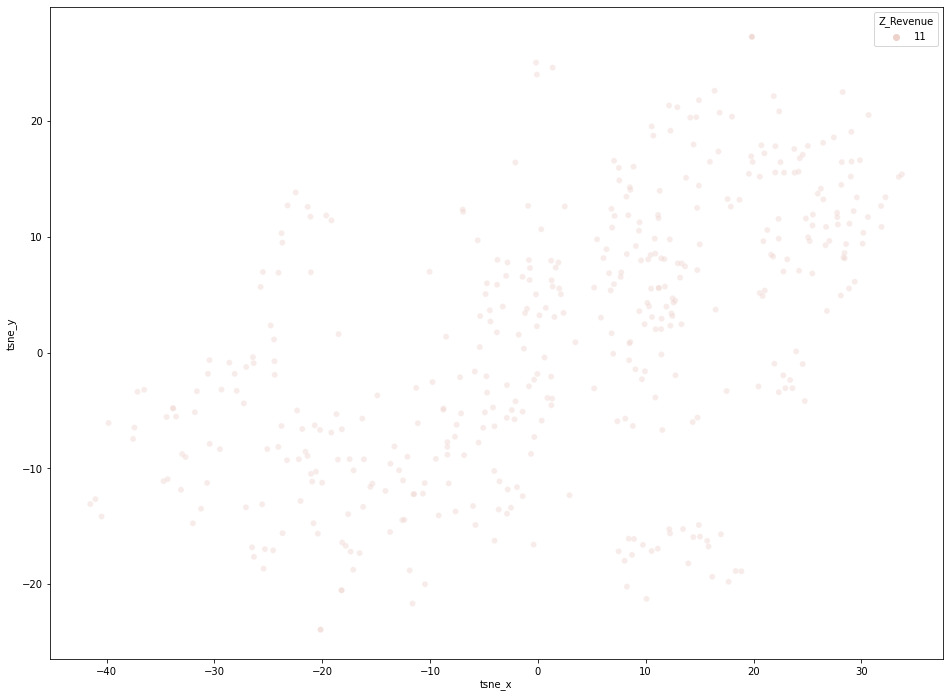

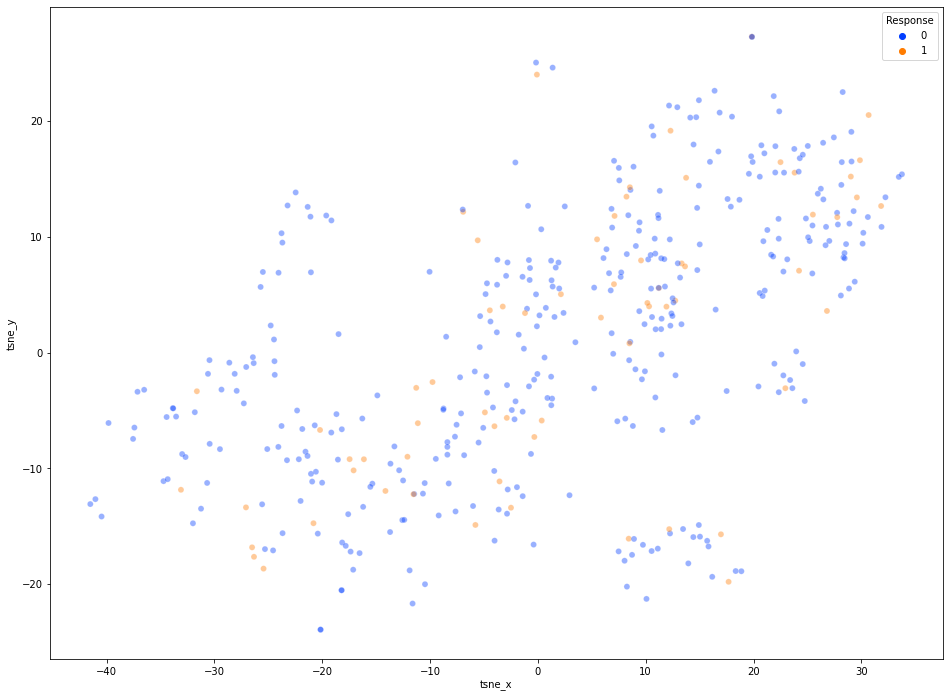

In [66]:
plotTsneAndSaveToFiles(df_learning_lab_perplexity, 'perplexity' + str(perplex) + '_')

In [152]:
perplex=30.0 # sets to default value


early_exag=100.0 # CHANGE ME


df_marketing_exaggeration = tuneHyperparametersTsne(df=df_learning_lab, scaled_df=scaled_df, n_components=n_comp, perplexity=perplex, early_exaggeration=early_exag, learning_rate=l_rate, 
random_state=rstate, n_iter= n_i, n_iter_without_progress=n_i_progress)


/tmp/ipykernel_10152/3569143405.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(16, 12))


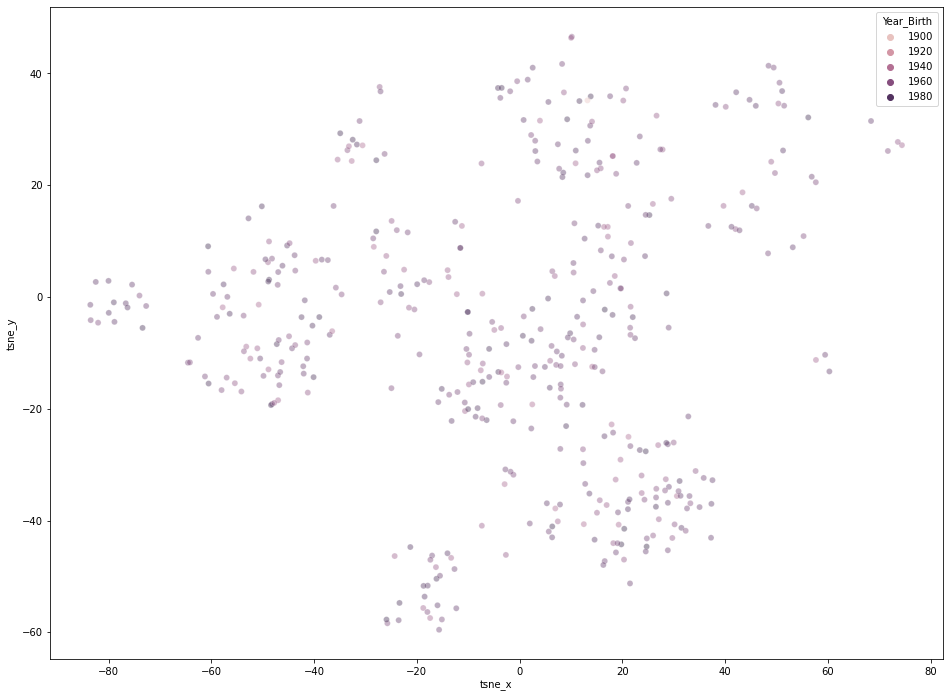

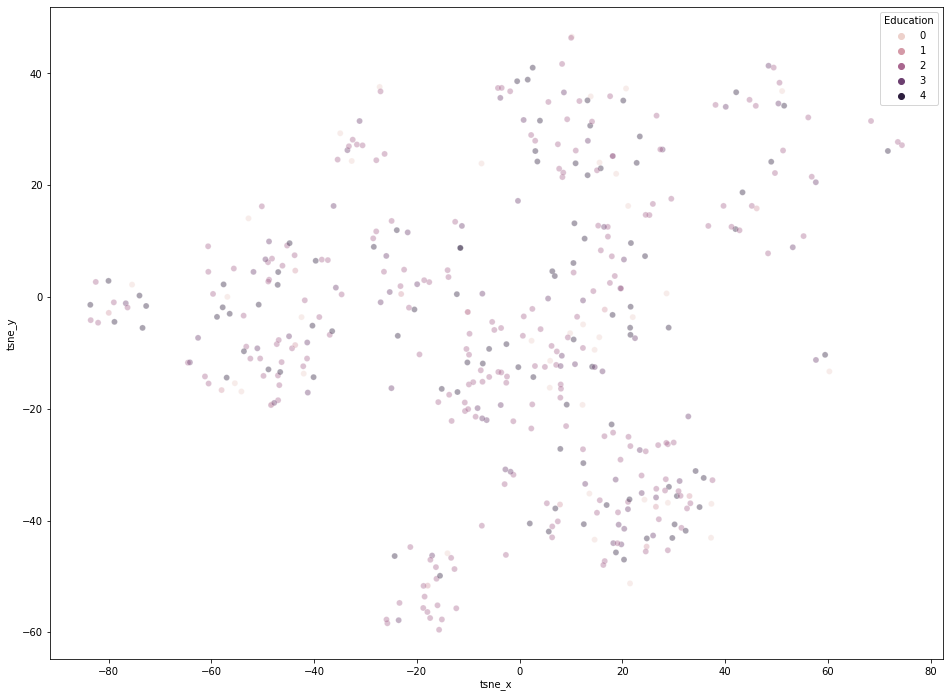

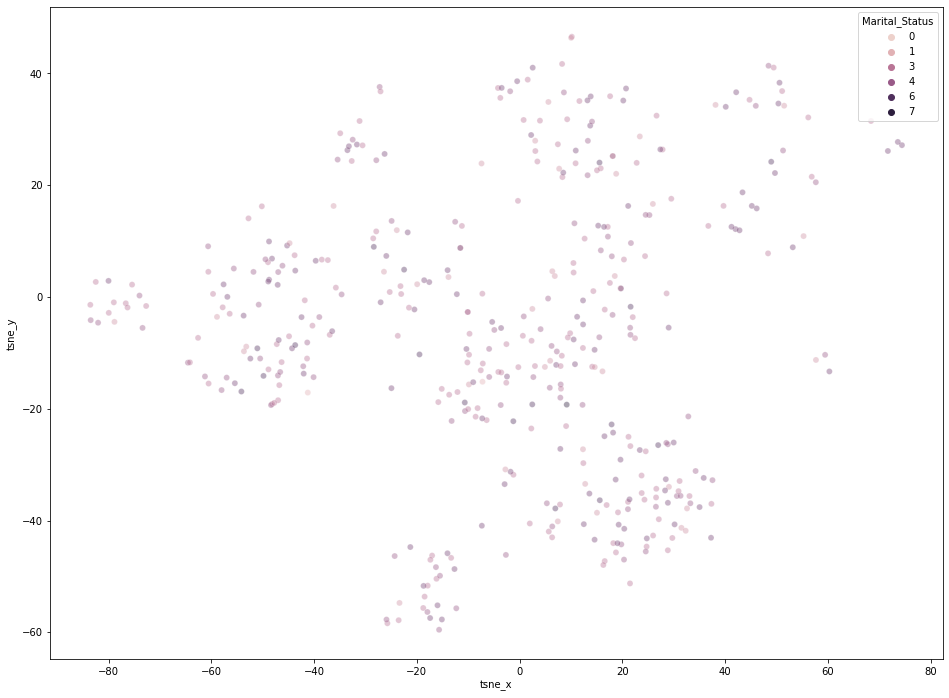

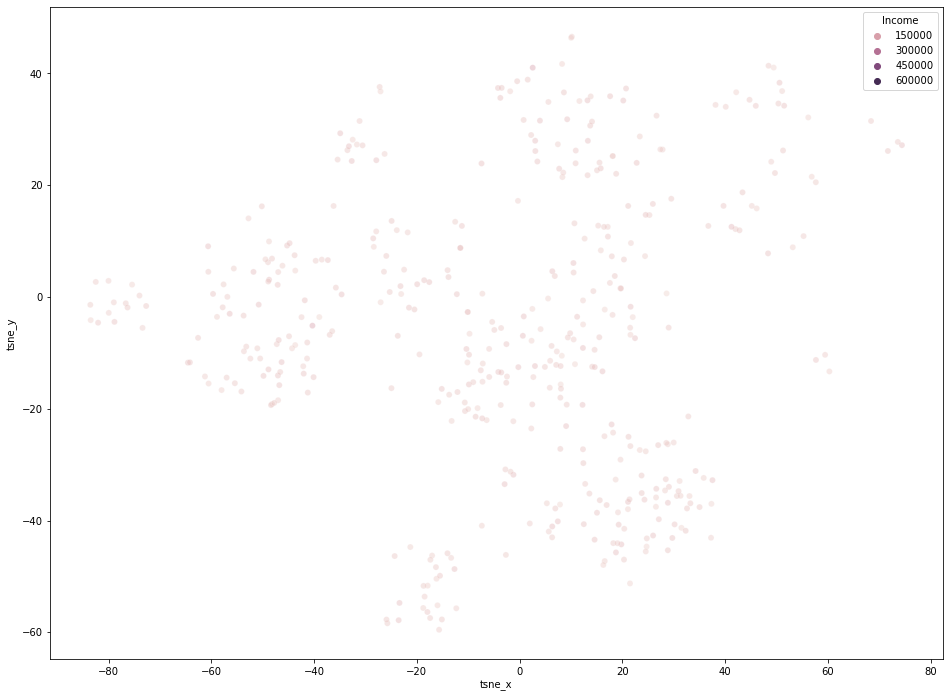

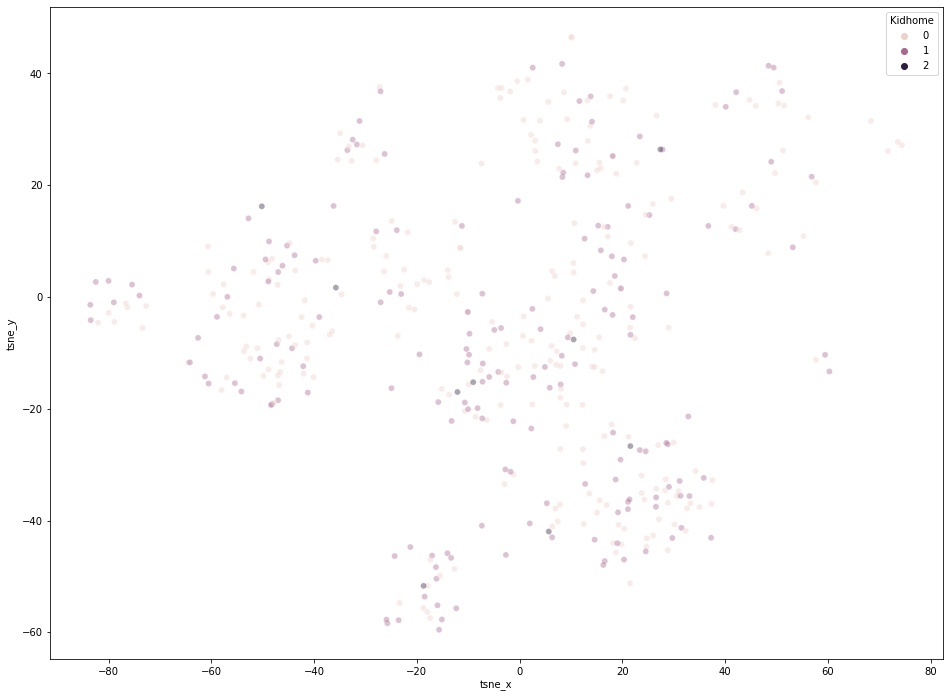

...

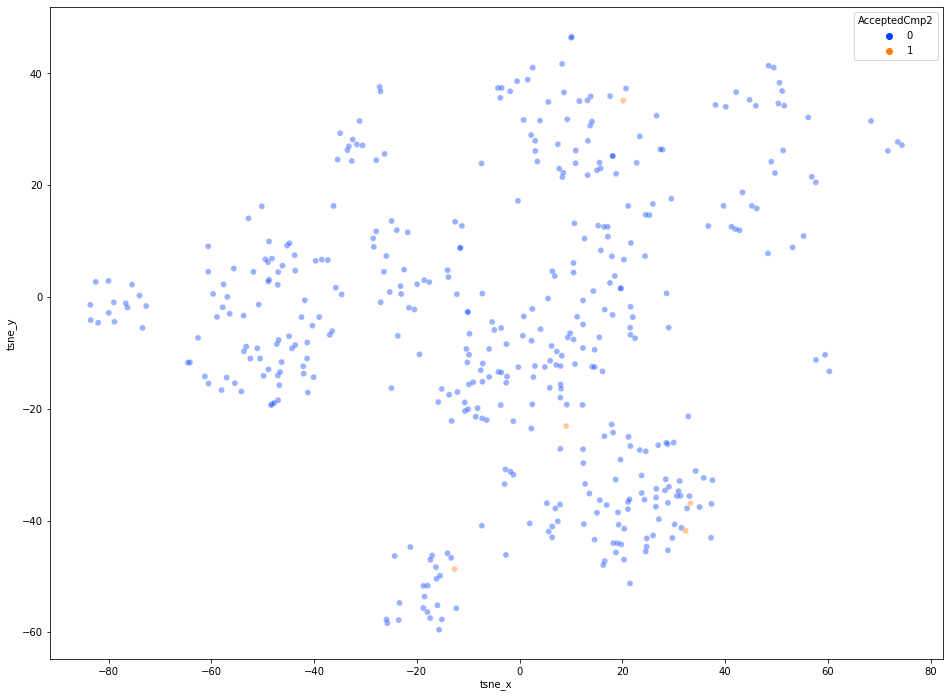

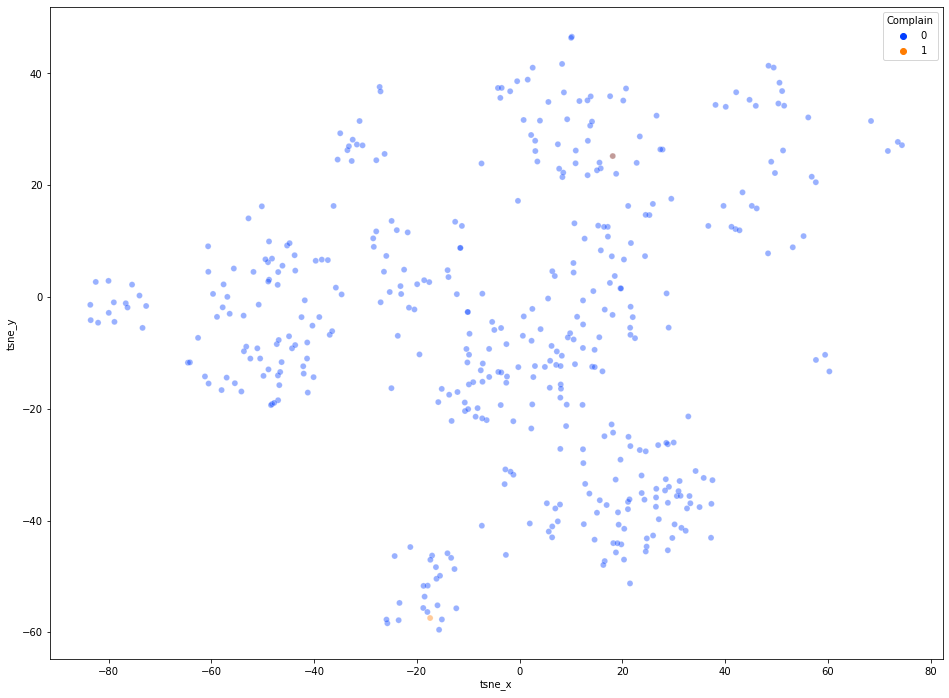

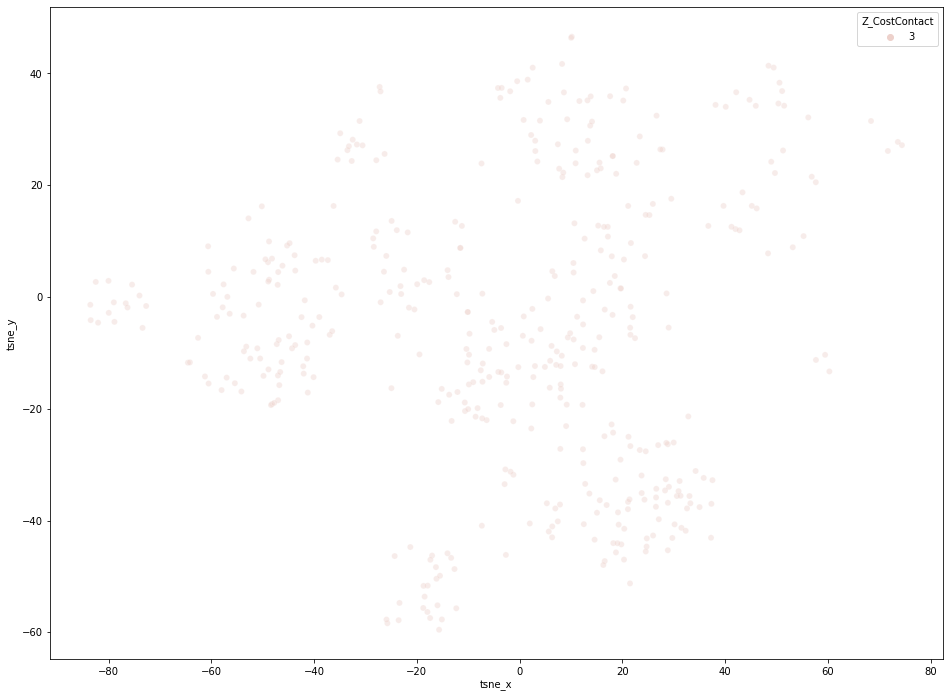

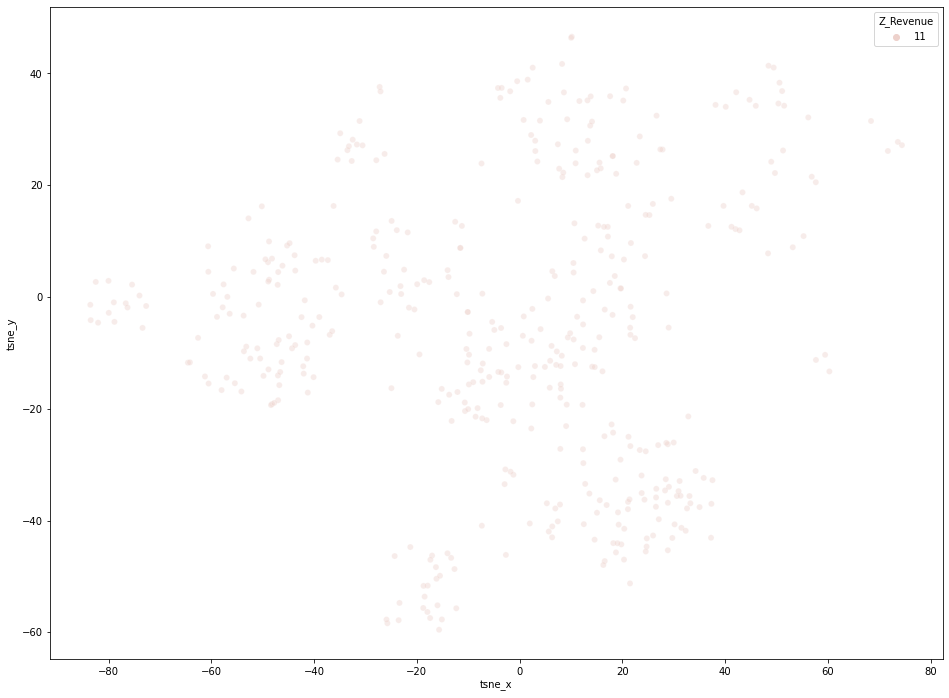

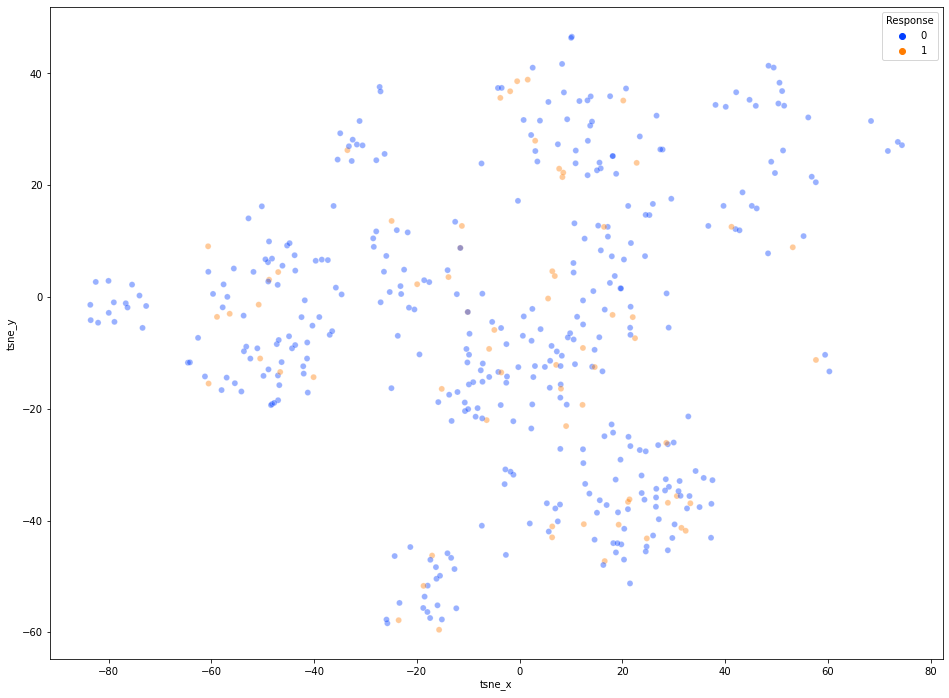

In [153]:
plotTsneAndSaveToFiles(df_marketing_exaggeration, 'exaggeration' + str(early_exag) + '_')

In [34]:
early_exag=12.0 # sets to default value


l_rate=1000.0 # CHANGE ME


df_marketing_lrate = tuneHyperparametersTsne(df=df_learning_lab, scaled_df=scaled_df, n_components=n_comp, perplexity=perplex, early_exaggeration=early_exag, learning_rate=l_rate, 
random_state=rstate, n_iter= n_i, n_iter_without_progress=n_i_progress)

/tmp/ipykernel_34202/3526440509.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(16, 12))


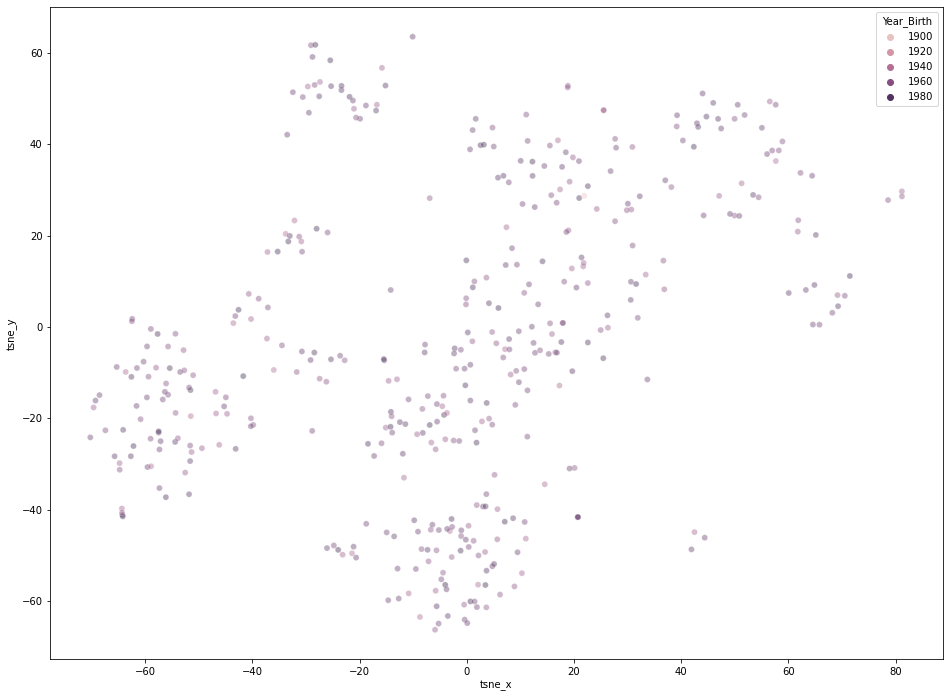

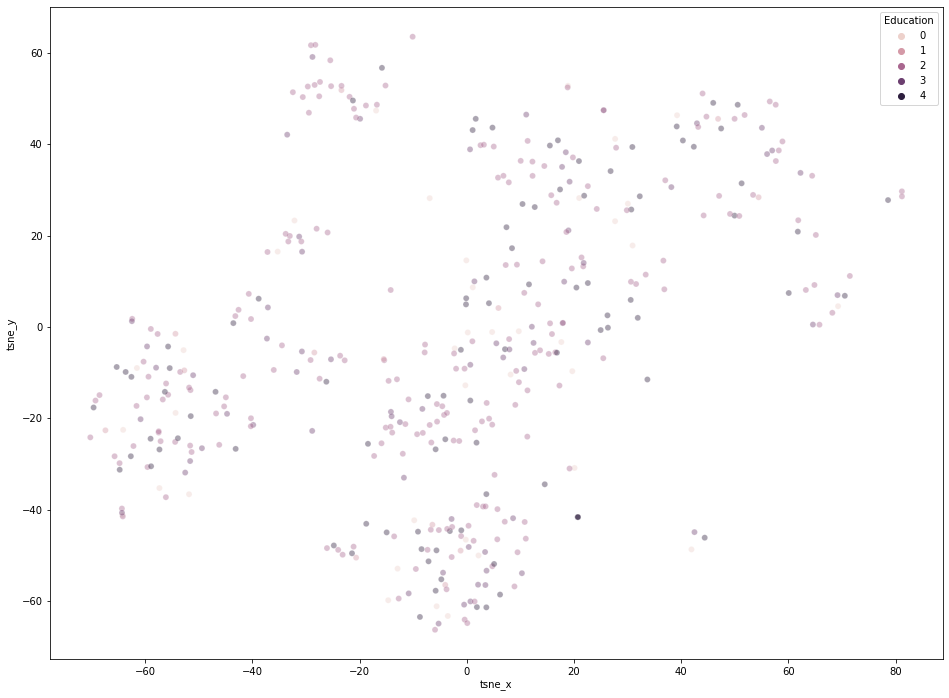

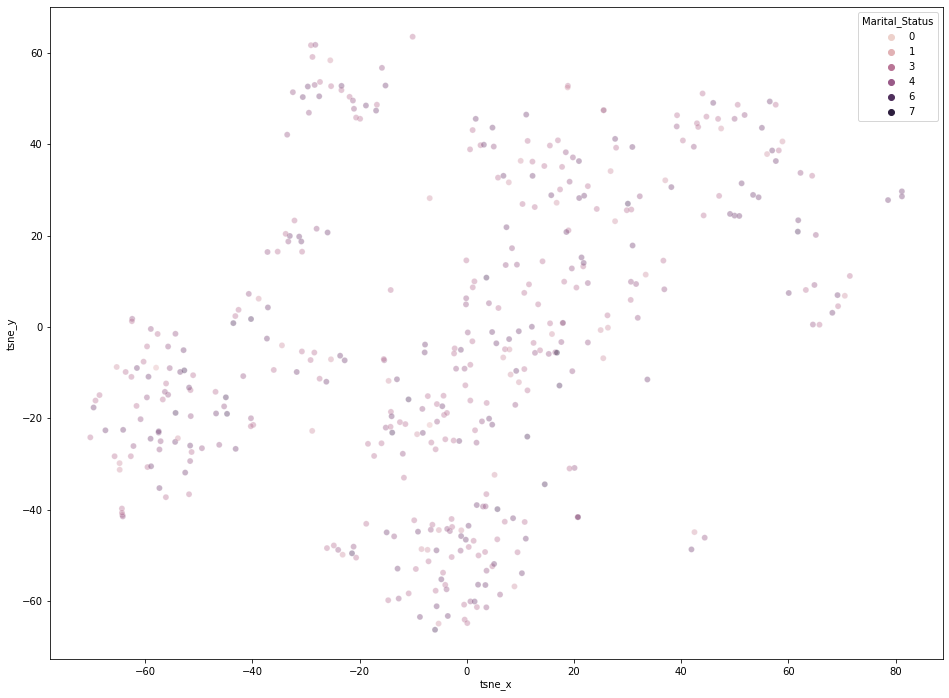

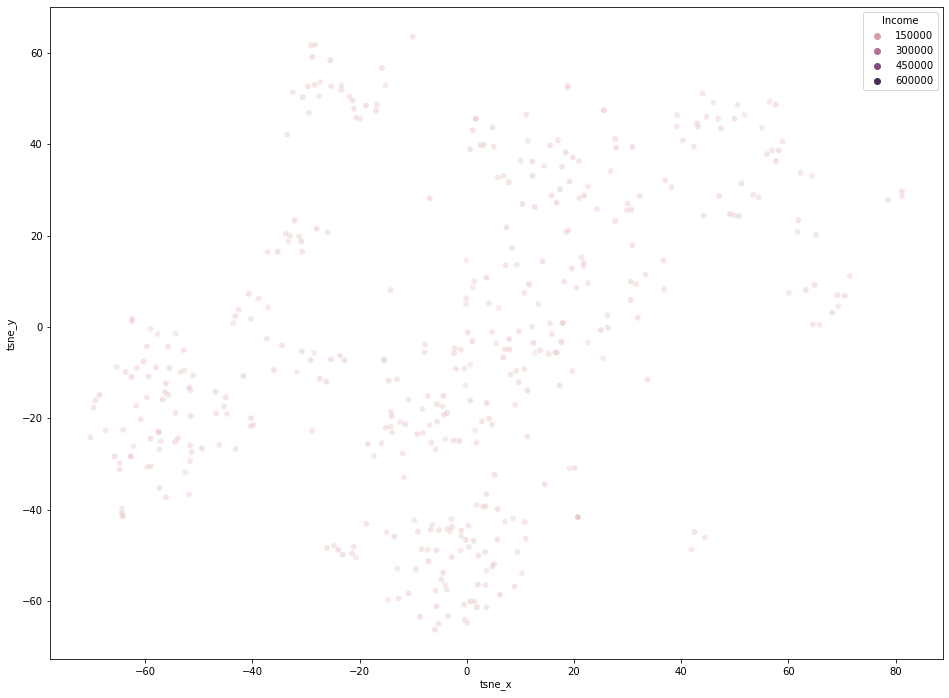

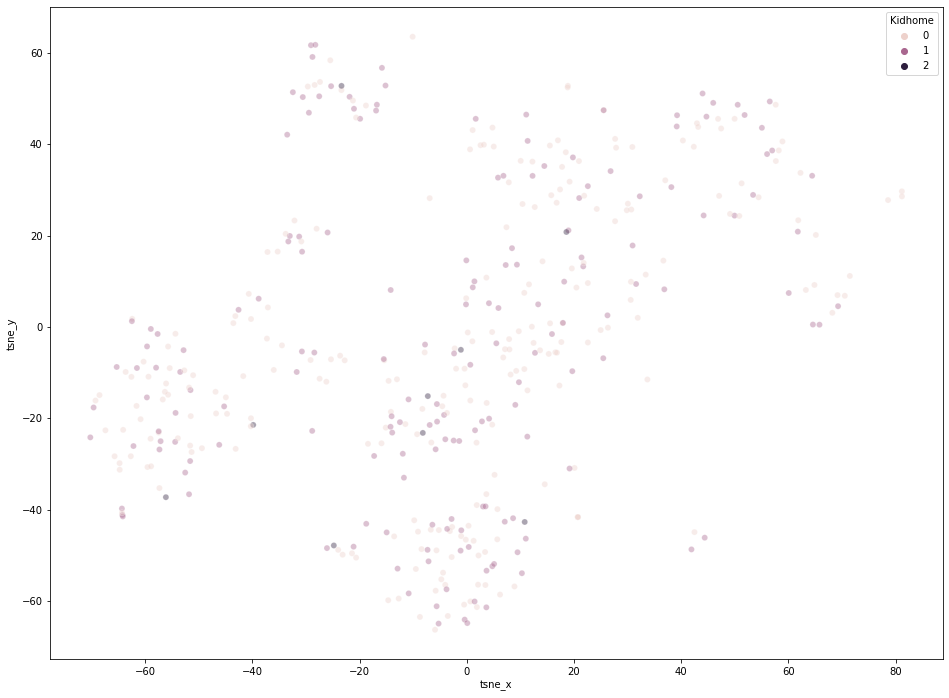

...

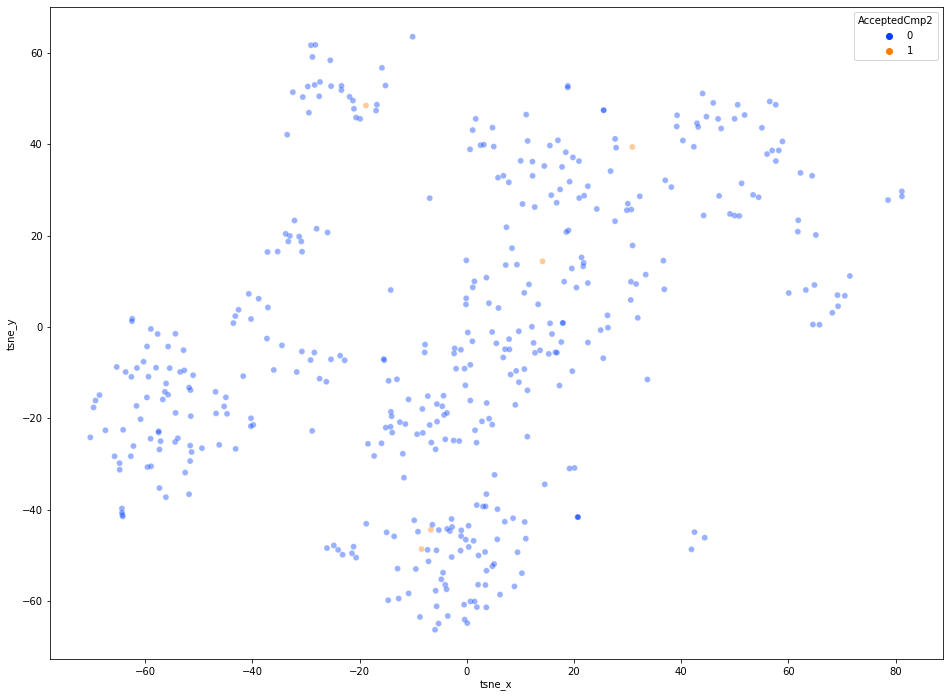

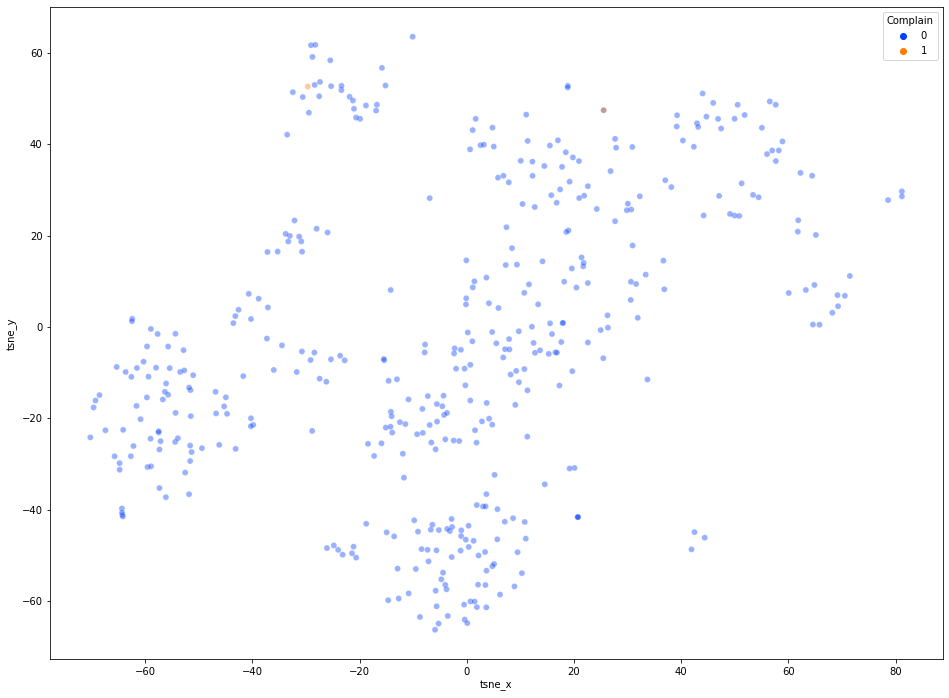

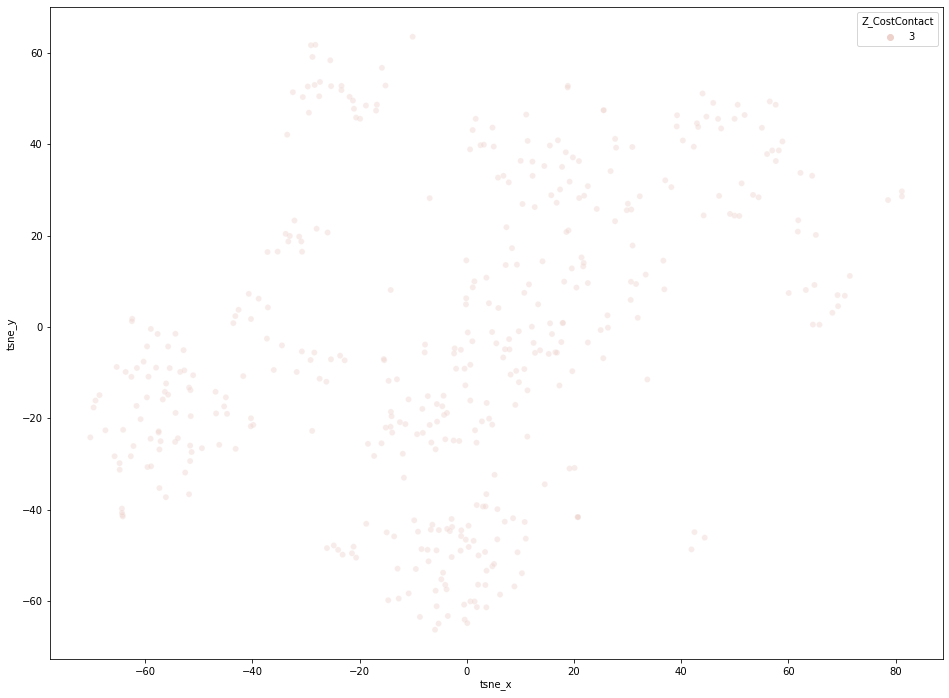

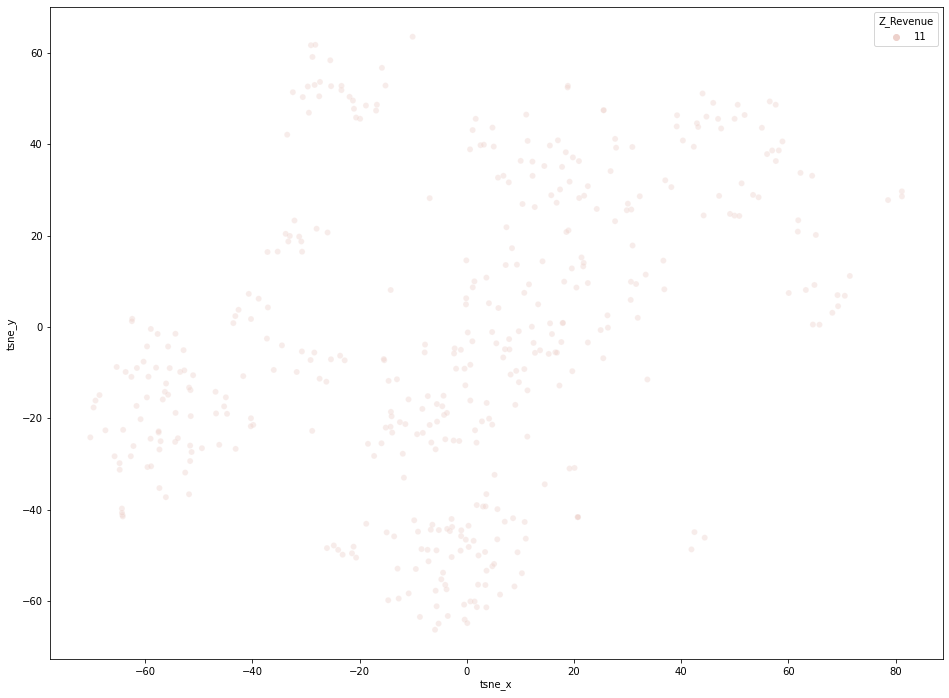

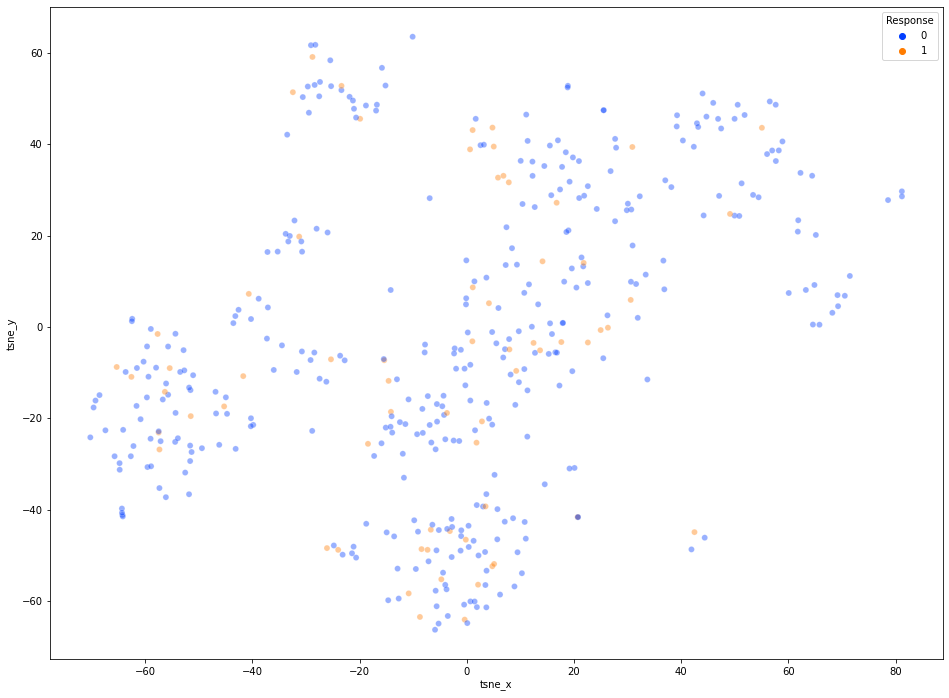

In [35]:
plotTsneAndSaveToFiles(df_marketing_lrate, 'lrate' + str(l_rate) + '_')

In [156]:
unscaled_df = unscaleData(scaler, scaled_df)